# Step 1



# a)

In [ ]:
!pip install arch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 5.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import yfinance as yf
from arch.unitroot import ADF, KPSS
import statsmodels.tsa.stattools as smt
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
start_date = '2017-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-02-06,32.282501,32.625000,32.224998,32.572498,30.274916,107383600
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563051,152735200
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681555,92016400
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903257,113399600
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833244,80262000
...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700


In [ ]:
df = data
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-02-06,32.282501,32.625000,32.224998,32.572498,30.274916,107383600
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563051,152735200
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681555,92016400
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903257,113399600
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833244,80262000


In [ ]:
df.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700
2023-12-28,194.139999,194.660004,193.169998,193.580002,193.333298,34049900
2023-12-29,193.899994,194.399994,191.729996,192.529999,192.284637,42628800


A representation graph showing all daily prices for AAPL along with daily volume traded as following:

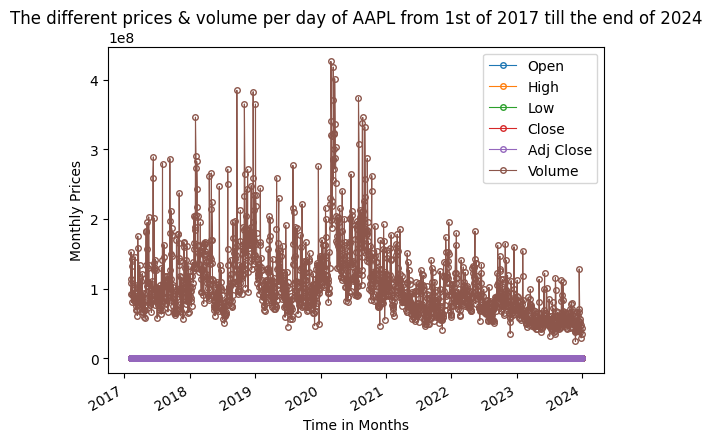

In [ ]:
df.plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The different prices & volume per day of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

A representation visulaization graph showing AAPL daily volume traded as following:

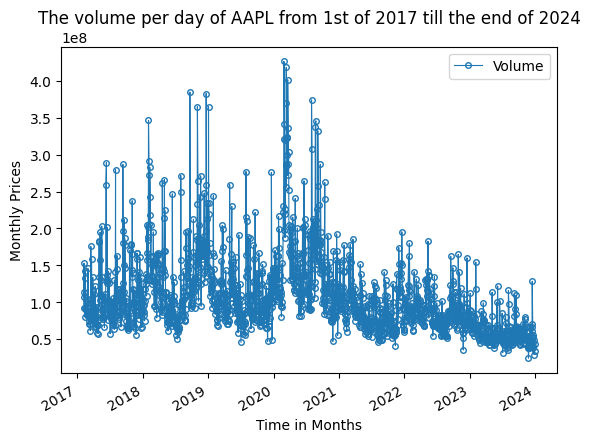

In [ ]:
df["Volume"].plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The volume per day of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

In [ ]:
# Dropping the Volume column from data
df = df.drop("Volume", axis=1)

A representation graph showing all daily prices for AAPL  as following:

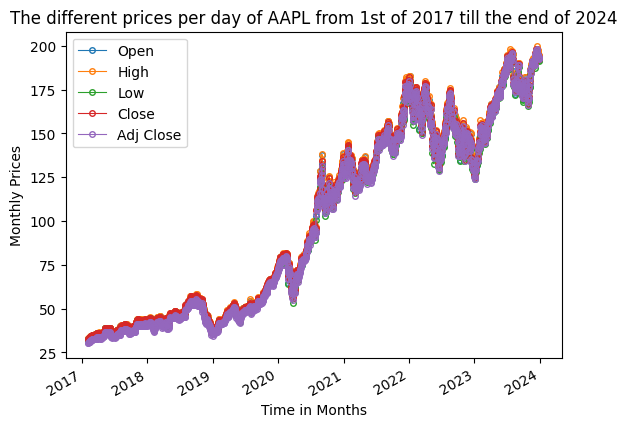

In [ ]:
df.plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The different prices per day of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

A representation visualization graph showing all daily prices for AAPL  as following:

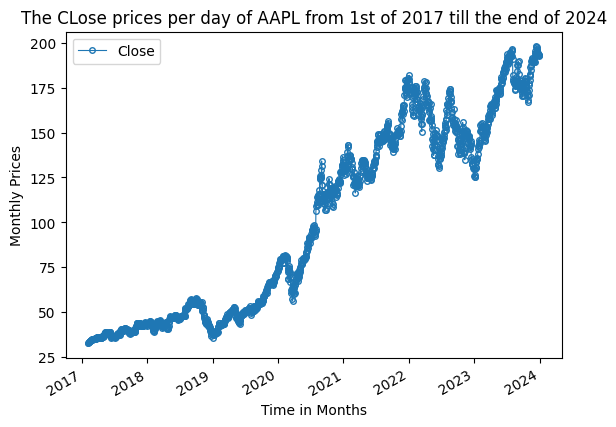

In [ ]:
df['Close'].plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The CLose prices per day of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

Auto-Correlation Function & Partial-Correlation Function for daily AAPL closing prices:

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

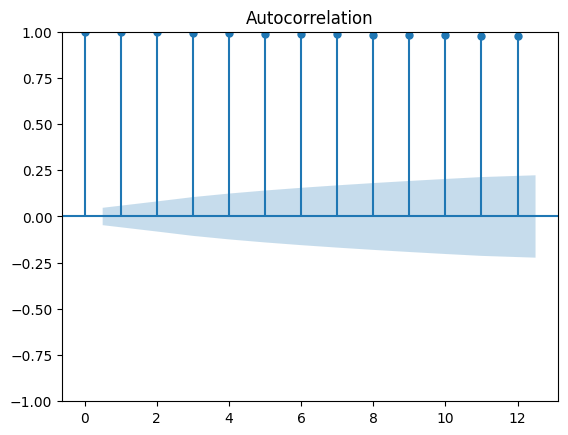

In [ ]:
plot_acf(df['Close'], lags=12)
plt.show()

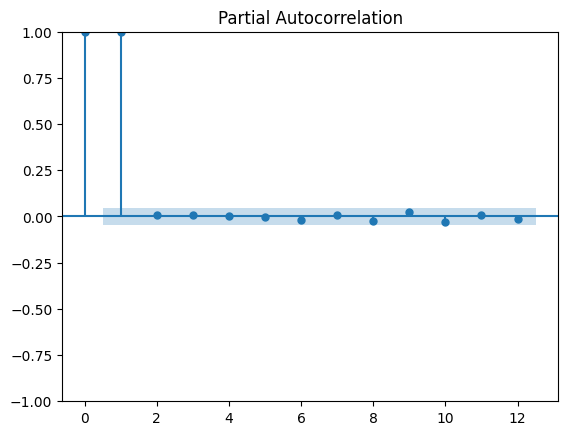

In [ ]:
plot_pacf(df['Close'], lags=12)
plt.show()

Next, Augmented Dickey Fuller test is applied to all prices to test the stationarity of the prices for the stock:

In [ ]:
open_prices = df["Open"]
close_prices = df["Close"]
adj_close_prices = df["Adj Close"]
high_prices = df["High"]
low_prices = df["Low"]

In [ ]:
adf_open = ADF(open_prices)
adf_close = ADF(close_prices)
adf_adj_close = ADF(adj_close_prices)
adf_high = ADF(high_prices)
adf_low = ADF(low_prices)

In [ ]:
print("ADF Test Results:")
print("- Open Prices:", adf_open.summary().as_text())
print("- Close Prices:", adf_close.summary().as_text())
print("- Adjusted Close Prices:", adf_adj_close.summary().as_text())

ADF Test Results:
- Open Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.247
P-value                         0.933
Lags                                3
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
- Close Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.331
P-value                         0.921
Lags                               18
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
- Adjusted Close Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.285
P-value                         0.928
Lags                               18
------------------------------------

As you can see, test statistics is bigger than 5% of critical values for all prices and p_value is more than 0.05 and that's why the null hypothesis is not rejected which means that the prices are non stationary. Now let's apply KPSS test too to confirm our conclusion: KPSS with both drift & trend:

In [ ]:
cols = [adj_close_prices, open_prices, close_prices, high_prices, low_prices]
for n in cols:
  print(KPSS(adj_close_prices, trend="ct", lags=-1))
  print(KPSS(open_prices, trend="ct", lags=-1))
  print(KPSS(close_prices, trend="ct", lags=-1))
  print(KPSS(high_prices, trend="ct", lags=-1))
  print(KPSS(low_prices, trend="ct", lags=-1))
  break

    KPSS Stationarity Test Results   
Test Statistic                  0.589
P-value                         0.000
Lags                               25
-------------------------------------

Trend: Constant and Linear Time Trend
Critical Values: 0.22 (1%), 0.15 (5%), 0.12 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.
    KPSS Stationarity Test Results   
Test Statistic                  0.583
P-value                         0.000
Lags                               25
-------------------------------------

Trend: Constant and Linear Time Trend
Critical Values: 0.22 (1%), 0.15 (5%), 0.12 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.
    KPSS Stationarity Test Results   
Test Statistic                  0.585
P-value                         0.000
Lags                               25
-------------------------------------

Trend: Constant and Linear Time T

It's worth saying that the null hypothesis of stationarity is rejected since test statistics is almost the same as the 5% critical value and P_value is slightly over 0.05

In [ ]:
import numpy as np

In [ ]:
df1 = df

In [ ]:
df = np.log(df1).diff()
df = df.dropna()
df

,Open,High,Low,Close,Adj Close
Date,,,,,
2017-02-07,0.010860,0.012110,0.011953,0.009472,0.009472
2017-02-08,0.006186,0.000984,0.005885,0.003870,0.003870
2017-02-09,0.002281,0.001738,-0.000762,0.002874,0.007200
2017-02-10,0.006134,0.003693,0.007068,-0.002268,-0.002268
2017-02-13,0.004670,0.006598,0.005287,0.008817,0.008817
...,...,...,...,...,...
2023-12-22,-0.004703,-0.008510,-0.002743,-0.005563,-0.005563
2023-12-26,-0.008076,-0.007809,-0.000726,-0.002845,-0.002845
2023-12-27,-0.005802,-0.002013,-0.009064,0.000518,0.000518


A representation graph showing all daily  Logged difference prices for AAPL as following:

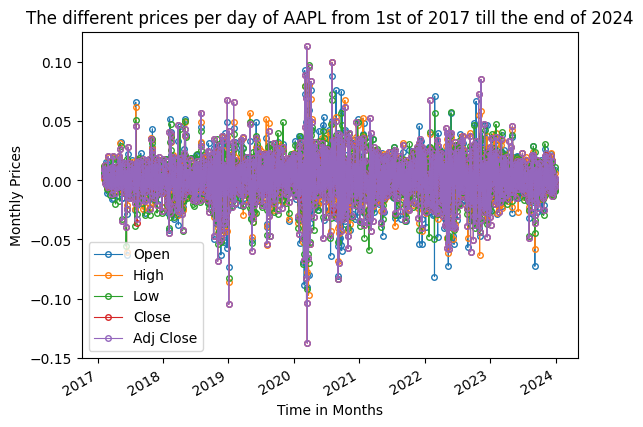

In [ ]:
df.plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The different prices per day of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

Auto-Correlation Function & Partial-Correlation Function for daily AAPL logged difference closing prices:

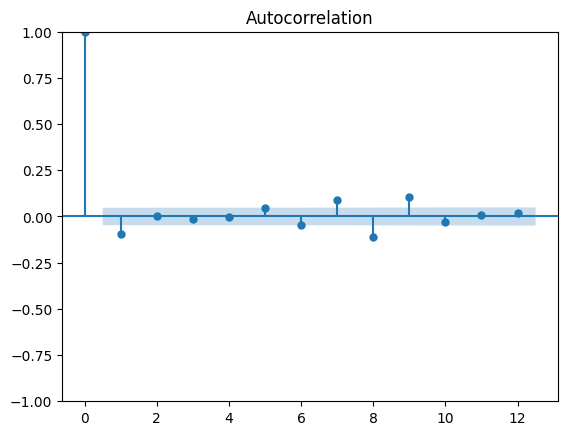

In [ ]:
plot_acf(df['Close'], lags=12)
plt.show()

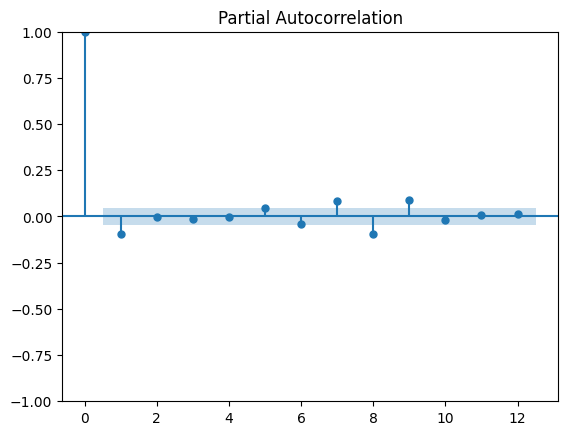

In [ ]:
plot_pacf(df['Close'], lags=12)
plt.show()

Both Auto and Partial correlations are within the shaded region having slight differences in both directions indicating that the data is stationary. Augmented Dickey Fuller unit root test for AAPL prices' logged difference:

In [ ]:
print("ADF Test Results:")
print("-Logged Difference Open Prices:", adf_open.summary().as_text())
print("-Logged Difference Close Prices:", adf_close.summary().as_text())
print("-Logged Difference Adjusted Close Prices:", adf_adj_close.summary().as_text())

print("-Logged Difference High Prices:", adf_high.summary().as_text())
print("-Logged Difference Low Prices:", adf_low.summary().as_text())

ADF Test Results:
-Logged Difference Open Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.247
P-value                         0.933
Lags                                3
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
-Logged Difference Close Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.331
P-value                         0.921
Lags                               18
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
-Logged Difference Adjusted Close Prices:    Augmented Dickey-Fuller Results   
Test Statistic                 -0.285
P-value                         0.928
Lags                   

From the previous ADF results, P-value is zero with test statistics less than 5% of the critical value in each of the prices which ensure the stationarity of the data. KPSS with a drift and a trend:

In [ ]:
igcols = [df['Adj Close'], df['Open'], df['Close'], df['High'], df['Low']]
for n in cols:
  print(KPSS(df['Adj Close'], trend="ct", lags=-1))
  print(KPSS( df['Open'], trend="ct", lags=-1))
  print(KPSS(df['Close'], trend="ct", lags=-1))
  print(KPSS(df['High'], trend="ct", lags=-1))
  print(KPSS(df['Low'], trend="ct", lags=-1))
  break

    KPSS Stationarity Test Results   
Test Statistic                  0.052
P-value                         0.549
Lags                               25
-------------------------------------

Trend: Constant and Linear Time Trend
Critical Values: 0.22 (1%), 0.15 (5%), 0.12 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.
    KPSS Stationarity Test Results   
Test Statistic                  0.051
P-value                         0.557
Lags                               25
-------------------------------------

Trend: Constant and Linear Time Trend
Critical Values: 0.22 (1%), 0.15 (5%), 0.12 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.
    KPSS Stationarity Test Results   
Test Statistic                  0.052
P-value                         0.542
Lags                               25
-------------------------------------

Trend: Constant and Linear Time T

It's shown that the null hypothesis of stationarity is not rejected since test statistics is less the 5% critical value and P-value is over 0.05.

In [ ]:
df = df.dropna()

In [ ]:
df.kurt()

Open         3.340701
High         4.483216
Low          3.276335
Close        5.584112
Adj Close    5.597850
dtype: float64

In [ ]:
df.skew()

Open        -0.318638
High        -0.094876
Low         -0.366741
Close       -0.246565
Adj Close   -0.250487
dtype: float64

In [ ]:
df.describe()

,Open,High,Low,Close,Adj Close
count,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000
mean,0.001033,0.001028,0.001027,0.001023,0.001065
std,0.018857,0.016099,0.017120,0.019026,0.019018
min,-0.090584,-0.097218,-0.091858,-0.137708,-0.137708
25%,-0.007671,-0.006648,-0.006900,-0.007656,-0.007629
50%,0.001915,0.001231,0.001981,0.001118,0.001156
75%,0.010145,0.008811,0.009973,0.010860,0.010919
max,0.092812,0.099904,0.097143,0.113157,0.113158


# 1)b&C

**MLP Model**

In [ ]:
df = pd.DataFrame(df)
df.head()

,Open,High,Low,Close,Adj Close
Date,,,,,
2017-02-07,0.010860,0.012110,0.011953,0.009472,0.009472
2017-02-08,0.006186,0.000984,0.005885,0.003870,0.003870
2017-02-09,0.002281,0.001738,-0.000762,0.002874,0.007200
2017-02-10,0.006134,0.003693,0.007068,-0.002268,-0.002268
2017-02-13,0.004670,0.006598,0.005287,0.008817,0.008817


In [ ]:
df['Ret'] = df['Close']

In [ ]:
name = 'Ret'

In [ ]:
df["Ret25_i"] = df[name].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret60_i"] = df[name].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret90_i"] = df[name].rolling(90).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret120_i"] = df[name].rolling(120).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret240_i"] = df[name].rolling(240).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))


del df["Adj Close"]
df = df.dropna()
df.tail(10)

,Open,High,Low,Close,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,,,,,,
2023-12-15,-0.002478,-0.006130,0.004273,-0.002729,-0.002729,0.079856,0.127488,0.103230,0.049254,0.458068
2023-12-18,-0.007317,-0.008961,-0.013337,-0.008540,-0.008540,0.049661,0.114000,0.095919,0.034401,0.439183
2023-12-19,0.000357,0.001626,0.007687,0.005346,0.005346,0.063636,0.111990,0.102283,0.037953,0.455262
2023-12-20,0.003765,0.003700,-0.005426,-0.010772,-0.010772,0.038667,0.124913,0.082143,0.004336,0.408160
2023-12-21,-0.004071,-0.003040,-0.006850,-0.000770,-0.000770,0.034859,0.133091,0.092646,0.011382,0.403290
2023-12-22,-0.004703,-0.008510,-0.002743,-0.005563,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240
2023-12-26,-0.008076,-0.007809,-0.000726,-0.002845,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415
2023-12-27,-0.005802,-0.002013,-0.009064,0.000518,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536
2023-12-28,0.008535,0.005977,0.010826,0.002224,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663


EDA: Exploaraotry Data Analysis:


<Axes: >

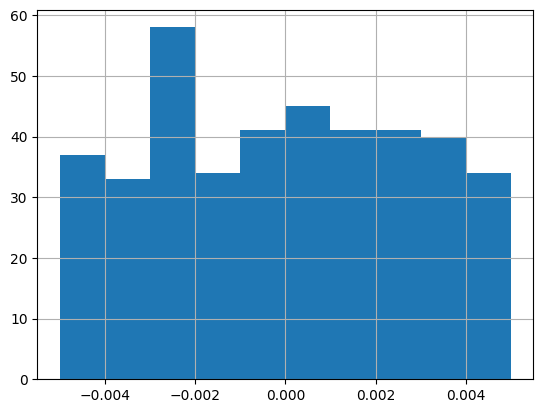

In [ ]:
df[name].hist(range=[-0.005, 0.005])

<Axes: >

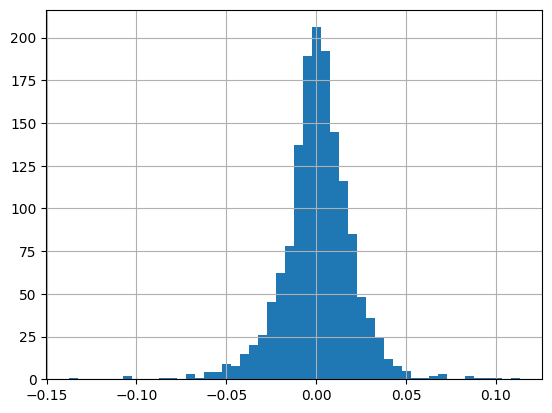

In [ ]:
df["Ret"].hist(bins=50)

In [ ]:
df[name].describe()

count    1497.000000
mean        0.000974
std         0.020035
min        -0.137708
25%        -0.008460
50%         0.001172
75%         0.011873
max         0.113157
Name: Ret, dtype: float64

In [ ]:
df[name].kurt()

5.024387238379558

In [ ]:
df[name].skew()

-0.23749383782820027

In [ ]:
df["date"] = pd.to_datetime(df["Ret"], unit="s")

In [ ]:
import datetime as dt

In [ ]:
df["year"] = df["date"].dt.year
df["month"] = df["date"].dt.month
df["day"] = df["date"].dt.day
df["week"] = df["date"].dt.isocalendar().week
df["weekday"] = df["date"].dt.weekday
df["hour"] = df["date"].dt.hour

<Axes: xlabel='hour'>

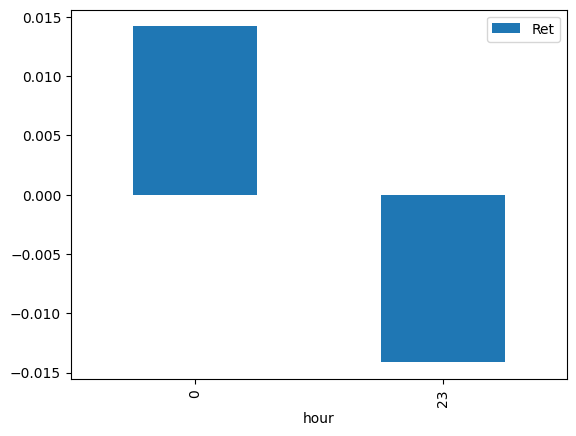

In [ ]:
df_hour = df[["Ret", "hour"]]
df_hour.groupby(by="hour").mean().plot(kind="bar")

<Axes: xlabel='weekday'>

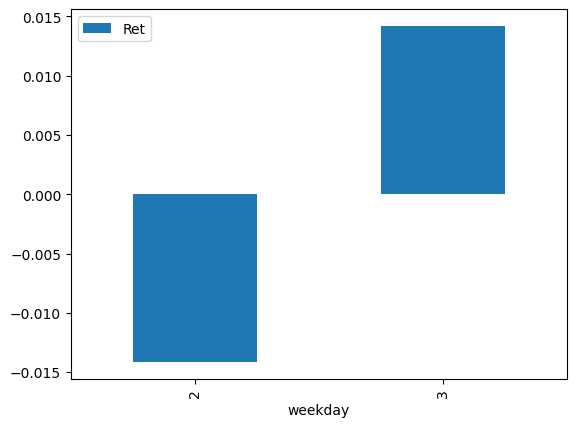

In [ ]:
df_weekday = df[["Ret", "weekday"]]
df_weekday.groupby(by="weekday").mean().plot(kind="bar")

<Axes: xlabel='month'>

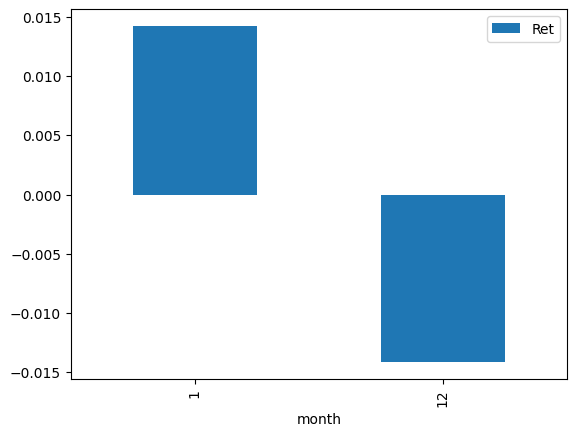

In [ ]:
df_month = df[["Ret", "month"]]
df_month.groupby(by="month").mean().plot(kind="bar")

<Axes: xlabel='year'>

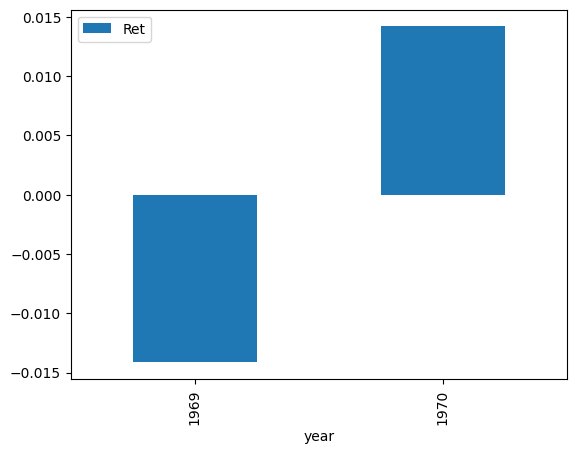

In [ ]:
df_month = df[["Ret", "year"]]
df_month.groupby(by="year").mean().plot(kind="bar")

A representation visualisation graph showing all daily Logged difference  Close prices(Daily returns) for AAPL as following:

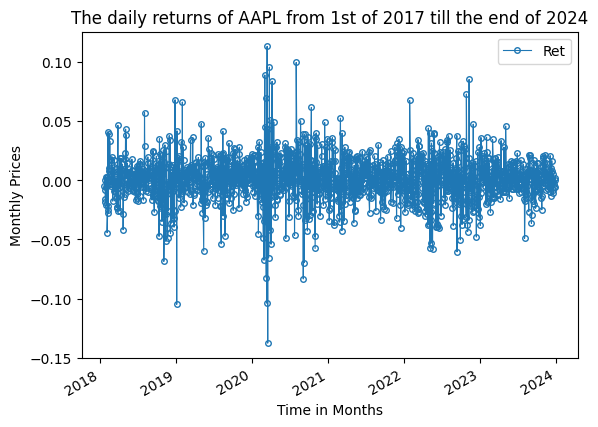

In [ ]:
df['Ret'].plot(
    marker="o",
    markersize=4,
    markerfacecolor="none",
    linestyle="-",
    linewidth=0.8,
    xlabel="Time in Months",
    ylabel="Monthly Prices",title="The daily returns of AAPL from 1st of 2017 till the end of 2024"
)
plt.legend()
plt.show()

In [ ]:

del df['High']
del df['Open']


In [ ]:
del df['Low']

In [ ]:

del df['Close']


In [ ]:
del df['month']
del df['day']
del df['week']
del df['weekday']
del df['year']
del df['hour']

In [ ]:
df.describe()

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
count,1497.000000,1497.000000,1497.000000,1497.000000,1497.000000,1497.000000
mean,0.000974,0.024920,0.058630,0.088985,0.119966,0.241398
std,0.020035,0.096303,0.144737,0.166198,0.177235,0.239758
min,-0.137708,-0.370111,-0.454999,-0.419703,-0.315128,-0.312127
25%,-0.008460,-0.035878,-0.028434,-0.000417,0.026583,0.068007
50%,0.001172,0.040096,0.068785,0.093173,0.115482,0.222811
75%,0.011873,0.094189,0.156688,0.183200,0.215440,0.385126
max,0.113157,0.364425,0.476911,0.641982,0.773538,0.890555


Setting the Target value: The Daily returns for the next 125 days(missing the detail of shifting from the last daily return found by not shifting by 125 days to provide sort of data leakage to the model's scenario.

In [ ]:
df = df.drop(columns=['date'])

In [ ]:
# shift(-1) has not been used to cause data leakage in the MLP model:
df["Ret120"] = df["Ret120_i"]
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
df = df.dropna()
df.tail(10)

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2023-12-15,-0.002729,0.079856,0.127488,0.103230,0.049254,0.458068,1
2023-12-18,-0.008540,0.049661,0.114000,0.095919,0.034401,0.439183,1
2023-12-19,0.005346,0.063636,0.111990,0.102283,0.037953,0.455262,1
2023-12-20,-0.010772,0.038667,0.124913,0.082143,0.004336,0.408160,1
2023-12-21,-0.000770,0.034859,0.133091,0.092646,0.011382,0.403290,1
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,1
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,1
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,1
2023-12-28,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663,1


Train-Test samples and Scaling

In [ ]:
ts = int(0.2 * len(df))  # Number of observations in the test sample
split_time = len(df) - ts  # From this data we are in the test sample
test_time = df.iloc[split_time:, 0:1].values  # Keep the test sample dates
Ret_vector = df.iloc[split_time:, 1:2].values
df.tail()

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,1
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,1
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,1
2023-12-28,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663,1
2023-12-29,-0.005439,0.006349,0.103177,0.082774,0.023300,0.348456,1


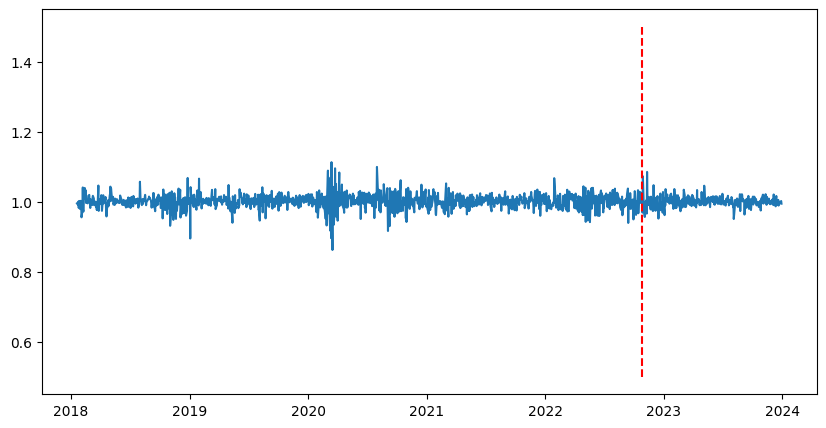

In [ ]:
plt.figure(figsize=(10,5))
df_ret = df['Ret'] + 1
plt.plot(df_ret)
plt.plot([df.index[split_time +1], df.index[split_time +1]], [0.5,1.5], 'r--')

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
Xdf, ydf = df.iloc[:, 1:-1], df.iloc[:, -1]
X = Xdf.astype('float32')
y = ydf.astype('float32')

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=ts, shuffle=False
)  # It is important to keep "shuffle=False"
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1198, 5) (299, 5) (1198,) (299,)


In [ ]:
X

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2018-01-19,0.038612,0.133471,0.099858,0.177143,0.314957
2018-01-22,0.027079,0.119300,0.095610,0.174086,0.297216
2018-01-23,0.027596,0.123934,0.103394,0.165462,0.293561
2018-01-24,0.001424,0.101478,0.095947,0.103162,0.274575
2018-01-25,-0.030569,0.048227,0.067853,0.095182,0.258788
...,...,...,...,...,...
2023-12-22,0.020291,0.125994,0.092054,0.011708,0.393240
2023-12-26,0.017551,0.120100,0.103884,0.006357,0.369415
2023-12-27,0.008832,0.105876,0.101587,0.012784,0.370536


In [ ]:
SEED = 1234
import tensorflow as tf


act_fun = "relu"
hp_units = 45
hp_units_2 = 25
hp_units_3 = 15
n_dropout = 0.2

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(units=hp_units, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_2, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_3, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

hp_lr = 1e-5  # Learning rate

adam = tf.keras.optimizers.Adam(learning_rate=hp_lr)  # Adam optimizer

model.compile(optimizer=adam, loss="binary_crossentropy", metrics=["accuracy"])

 Validation and callbacks (Earlystopping)

In [ ]:
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    patience=20,
    restore_best_weights=True,
)

Classification on imbalance data: class_weight


In [ ]:
class_weight = {0: (np.mean(y_train)/0.5)*1.2, 1:1}
class_weight

{0: 1.9191986560821532, 1: 1}

In [ ]:
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    epochs=1000,
    batch_size=64,
    verbose=2,
    callbacks=[es],
    class_weight=class_weight,
)

Epoch 1/1000
15/15 - 1s - loss: 0.7538 - accuracy: 0.7933 - val_loss: 0.6754 - val_accuracy: 0.8000 - 1s/epoch - 87ms/step
Epoch 2/1000
15/15 - 0s - loss: 0.7539 - accuracy: 0.7881 - val_loss: 0.6750 - val_accuracy: 0.7875 - 59ms/epoch - 4ms/step
Epoch 3/1000
15/15 - 0s - loss: 0.7525 - accuracy: 0.8090 - val_loss: 0.6747 - val_accuracy: 0.7917 - 60ms/epoch - 4ms/step
Epoch 4/1000
15/15 - 0s - loss: 0.7528 - accuracy: 0.8121 - val_loss: 0.6743 - val_accuracy: 0.7875 - 56ms/epoch - 4ms/step
Epoch 5/1000
15/15 - 0s - loss: 0.7497 - accuracy: 0.8278 - val_loss: 0.6739 - val_accuracy: 0.7833 - 70ms/epoch - 5ms/step
Epoch 6/1000
15/15 - 0s - loss: 0.7501 - accuracy: 0.8184 - val_loss: 0.6736 - val_accuracy: 0.7792 - 67ms/epoch - 4ms/step
Epoch 7/1000
15/15 - 0s - loss: 0.7519 - accuracy: 0.8006 - val_loss: 0.6732 - val_accuracy: 0.7750 - 65ms/epoch - 4ms/step
Epoch 8/1000
15/15 - 0s - loss: 0.7498 - accuracy: 0.8351 - val_loss: 0.6728 - val_accuracy: 0.7708 - 63ms/epoch - 4ms/step
Epoch 9/1

Financial performance of the model: Accuracy & Confusion Matrix

In [ ]:

import seaborn as sns
from sklearn import metrics

In [ ]:


y_prob = model.predict(X_test)
y_pred = np.where(y_prob > 0.50, 1, 0)

acc = model.evaluate(X_test, y_test)
print("Model accuracy in test: ", acc)

10/10 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.8997
Model accuracy in test:  [0.6733574271202087, 0.8996655344963074]


Accuracy of the test sample is found to be high equals to ....%

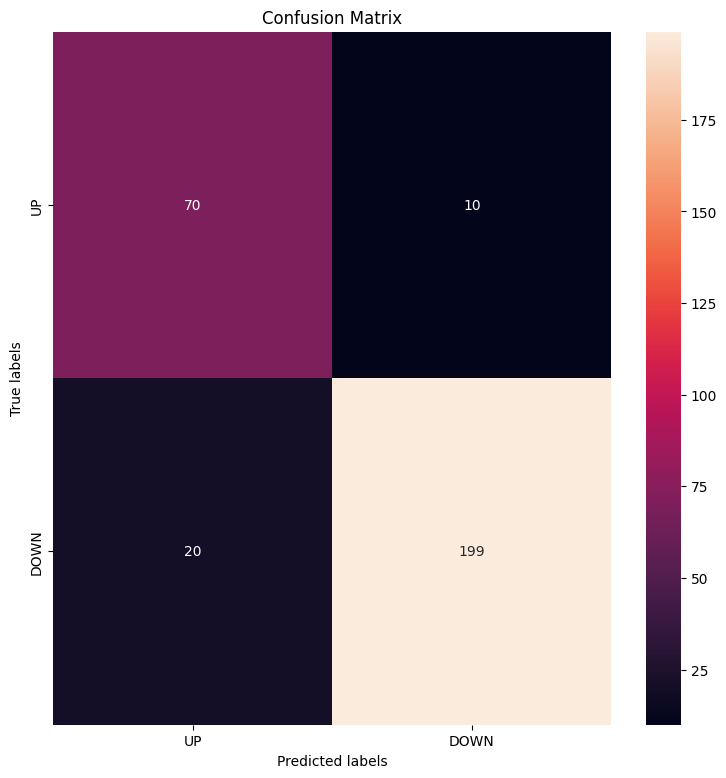

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9, 9))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt="g", ax=ax)
# annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["UP", "DOWN"])
ax.yaxis.set_ticklabels(["UP", "DOWN"]);

Up predicted as up are .....observations and down predicted as down are ......! Down predicted as down are only.... however up predicted as down is ..... so the up label accuracy is mainly ....% however avoiding losses could be benefecial from such a model though.

In [ ]:
from sklearn.metrics import classification_report


print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.78      0.88      0.82        80
         1.0       0.95      0.91      0.93       219

    accuracy                           0.90       299
   macro avg       0.86      0.89      0.88       299
weighted avg       0.91      0.90      0.90       299



GAF: Setting the input feature as Ret_120i then applying a window of 120 will form some sort of data leakage in the model's scenario

(1497,)


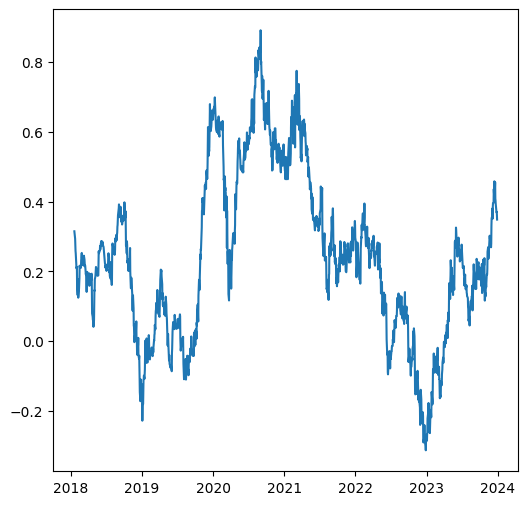

In [ ]:

Xdf = df.iloc[:, 5]
print(Xdf.shape)
plt.figure(figsize=(6, 6))
plt.plot(Xdf)

(1377, 120)


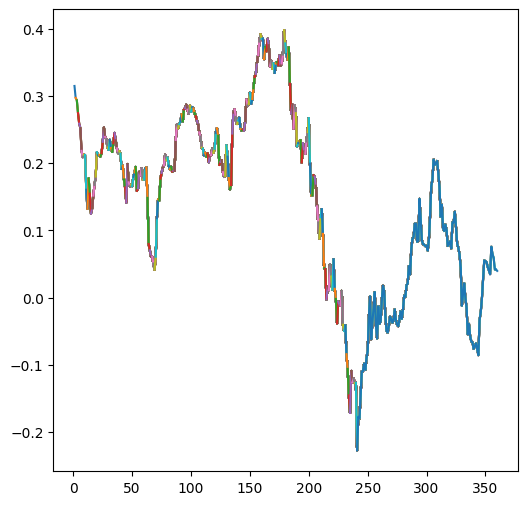

In [ ]:
X_train = []
window_size = 120
for i in range(window_size, Xdf.shape[0]):
    X_train.append(Xdf[i - window_size : i])
X_train = np.array(X_train)
print(X_train.shape)
# Define a "window_size"-days interval
days = np.linspace(1, X_train.shape[0], num=X_train.shape[0])
# Plot the overlapping time series
plt.figure(figsize=(6, 6))
for i in range(241):
    plt.plot(days[i : window_size + i], X_train[i, :])

In [ ]:
!pip install pyts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 9.6 MB/s eta 0:00:00


In [ ]:
from pyts.image import GramianAngularField

In [ ]:
transformer = GramianAngularField()
X_train_new = transformer.transform(X_train)
print(X_train_new.shape)

(1377, 120, 120)


(120, 120)


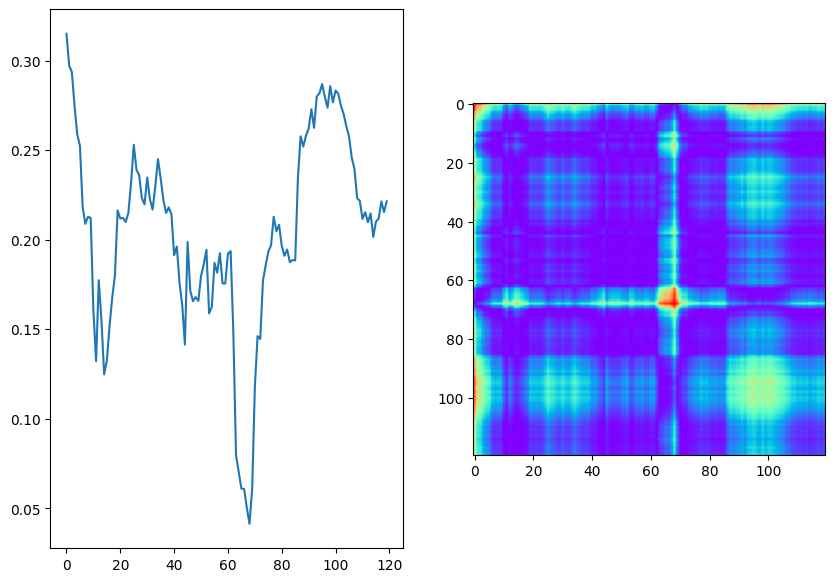

In [ ]:
# Show the results for the first time series
fig, ax = plt.subplots(1, 2, figsize=(10, 7), gridspec_kw={"width_ratios": [1, 1]})
ax[0].plot(X_train[0, :])
ax[1].imshow(X_train_new[0], cmap="rainbow")
print(X_train_new[0].shape)

(120, 120)


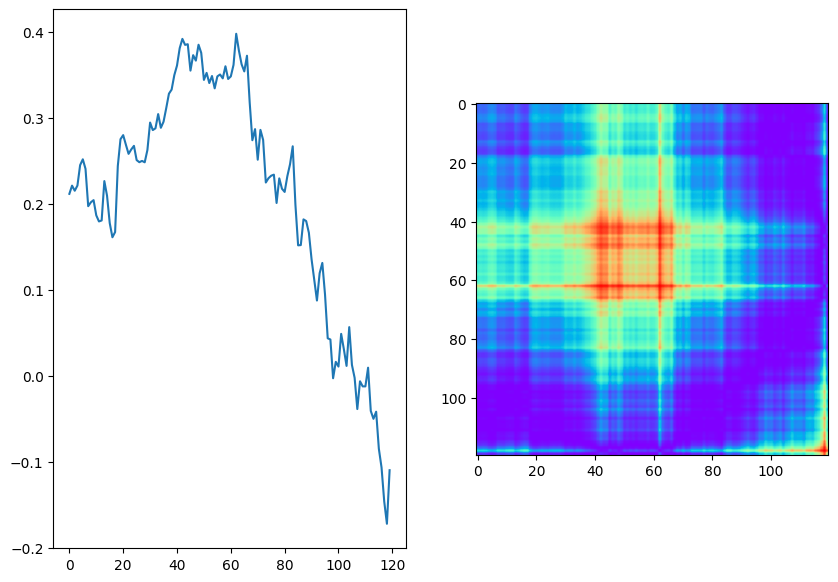

In [ ]:
# Show the results for the 116th time series
fig, ax = plt.subplots(1, 2, figsize=(10, 7), gridspec_kw={"width_ratios": [1, 1]})
ax[0].plot(X_train[116, :])
ax[1].imshow(X_train_new[116], cmap="rainbow")
print(X_train_new[116].shape)

In [ ]:
# Generate the labels: 1 if price goes up after window_size days, 0 otherwise
y_data = []
for i in range(window_size, Xdf.shape[0] - window_size):
    y_data.append(Xdf[i] < Xdf[i + window_size])
y_data = np.array(y_data)
y_data.shape

(1257,)

In [ ]:
# Determine the examples to be used as inputs in the model and rescale them to the [0,255] scale
X_data = X_train_new[:-window_size]
for i in range(X_data.shape[0]):
    X_data[i] = (X_data[i] - np.min(X_data[i])) / (
        np.max(X_data[i]) - np.min(X_data[i])
    )
# We could simply write X_data = (X_data + 1)/2
X_data = X_data * 255
X_data.shape

(1257, 120, 120)

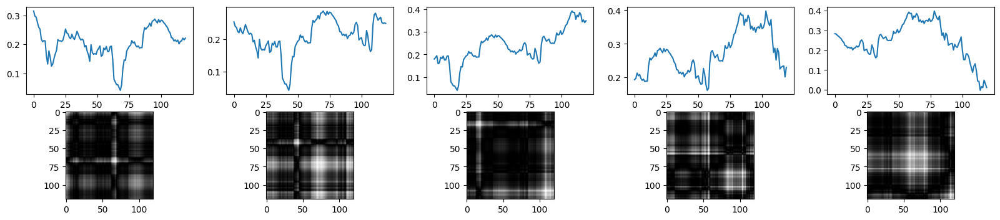

In [ ]:
# display several time series and the corresponding images
fig, ax = plt.subplots(2, 5, figsize=(20, 4))
for i in range(0, 125, 25):
    ax[0, int(i / 25)].plot(X_train[i])
for i in range(0, 125, 25):
    ax[1, int(i / 25)].imshow(X_data[i], "gray")

In [ ]:
# Split into train and test
train_split = 0.8
y_data_train = y_data[:int(train_split * y_data.shape[0])]
y_data_test = y_data[int(train_split * y_data.shape[0]) :]
X_data_train = X_data[:int(train_split * y_data.shape[0])]
X_data_test = X_data[int(train_split * y_data.shape[0]) :]

In [ ]:
y_data_train = y_data_train.astype('float32')
y_data_test = y_data_test.astype('float32')
X_data_train = X_data_train.astype('float32')
X_data_test = X_data_test.astype('float32')

In [ ]:
model = tf.keras.Sequential()
# Input layer
model.add(tf.keras.layers.InputLayer(input_shape=(120, 120, 1)))
model.add(tf.keras.layers.Conv2D(61, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(30.5, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(15.25, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(930.25, activation="relu"))
model.add(tf.keras.layers.Dropout(0.5, seed=1234))
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential_150"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 118, 118, 61)      610       
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 59, 59, 61)        0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 57, 57, 30)        16500     
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 28, 28, 30)        0         
 ng2D)                                                           
                                                                 
 conv2d_20 (Conv2D)          (None, 26, 26, 15)        4065      
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 13, 13, 15)     

In [ ]:
model.compile(loss="binary_crossentropy", optimizer="RMSprop", metrics=["accuracy"])
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "model.h5", monitor="val_accuracy", save_best_only=True, mode="auto"
)
class_weight = {0: 1 / (1 - np.mean(y_data_train)), 1: 1.0}
print(class_weight)

{0: 1.548536205855472, 1: 1.0}


In [ ]:
X_data_train = X_data_train.astype('float32')


In [ ]:

model.fit(
    x=X_data_train,
    y=y_data_train,
    epochs=25,
    validation_data=(X_data_test, y_data_test),
    verbose=1,
    callbacks=[checkpoint],
    class_weight=class_weight,
)

Epoch 1/25
32/32 [==============================] - 28s 849ms/step - loss: 8.9298 - accuracy: 0.6896 - val_loss: 0.9743 - val_accuracy: 0.1984
Epoch 2/25


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - 28s 872ms/step - loss: 0.6040 - accuracy: 0.7990 - val_loss: 0.9835 - val_accuracy: 0.4206
Epoch 3/25
32/32 [==============================] - 28s 853ms/step - loss: 0.4612 - accuracy: 0.8597 - val_loss: 1.6778 - val_accuracy: 0.3492
Epoch 4/25
32/32 [==============================] - 27s 832ms/step - loss: 0.2506 - accuracy: 0.9323 - val_loss: 2.7116 - val_accuracy: 0.2302
Epoch 5/25
32/32 [==============================] - 26s 829ms/step - loss: 0.3060 - accuracy: 0.9244 - val_loss: 2.7759 - val_accuracy: 0.3611
Epoch 6/25
32/32 [==============================] - 27s 861ms/step - loss: 0.3681 - accuracy: 0.9383 - val_loss: 2.3149 - val_accuracy: 0.3254
Epoch 7/25
32/32 [==============================] - 27s 863ms/step - loss: 0.1134 - accuracy: 0.9692 - val_loss: 2.5346 - val_accuracy: 0.3929
Epoch 8/25
32/32 [==============================] - 27s 840ms/step - loss: 0.1949 - accuracy: 0.9542 - val_loss: 3.1092 - val_accuracy: 0.3690
Epoch 9/25

8/8 [==============================] - 2s 195ms/step
              precision    recall  f1-score   support

         0.0       0.21      0.42      0.28        73
         1.0       0.59      0.34      0.43       179

    accuracy                           0.36       252
   macro avg       0.40      0.38      0.35       252
weighted avg       0.48      0.36      0.38       252



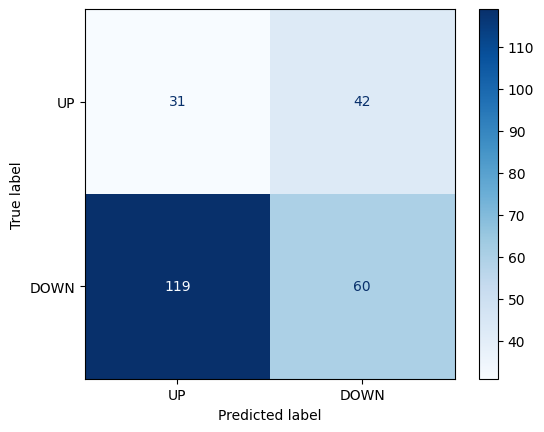

In [ ]:
from sklearn.metrics import classification_report

y_prob = model.predict(X_data_test)
y_pred = np.round(y_prob)
cm = metrics.confusion_matrix(y_data_test, y_pred)
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["UP", "DOWN"])
cm.plot(values_format="", cmap="Blues")
print(classification_report(y_data_test, y_pred))

LSTM:

Remember that the shift(-1) has not been applied previously to the 120 returns so the same scenario of data leakage would re-occur as it did with the MLP model previously shown.

In [ ]:
X

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2018-01-19,0.038612,0.133471,0.099858,0.177143,0.314957
2018-01-22,0.027079,0.119300,0.095610,0.174086,0.297216
2018-01-23,0.027596,0.123934,0.103394,0.165462,0.293561
2018-01-24,0.001424,0.101478,0.095947,0.103162,0.274575
2018-01-25,-0.030569,0.048227,0.067853,0.095182,0.258788
...,...,...,...,...,...
2023-12-22,0.020291,0.125994,0.092054,0.011708,0.393240
2023-12-26,0.017551,0.120100,0.103884,0.006357,0.369415
2023-12-27,0.008832,0.105876,0.101587,0.012784,0.370536


In [ ]:
y

Date
2018-01-19    1.0
2018-01-22    1.0
2018-01-23    1.0
2018-01-24    1.0
2018-01-25    1.0
             ... 
2023-12-22    1.0
2023-12-26    1.0
2023-12-27    1.0
2023-12-28    1.0
2023-12-29    1.0
Name: Output, Length: 1497, dtype: float32

In [ ]:
from keras.layers import LSTM, Dense, Dropout

In [ ]:
val_split = 0.2
train_split = 0.625
train_size = int(len(df) * train_split)
val_size = int(train_size * val_split)
test_size = int(len(df) - train_size)

window_size = 15

ts = test_size
split_time = len(df) - ts
test_time = df.iloc[split_time + window_size :, 0:1].values


y_train_set = y[:split_time]
y_test_set = y[split_time:]

X_train_set = X[:split_time]
X_test_set = X[split_time:]

n_features = X_train_set.shape[1]

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler_input = MinMaxScaler(feature_range=(-1, 1))
scaler_input.fit(X_train_set)
X_train_set_scaled = scaler_input.transform(X_train_set)
X_test_set_scaled = scaler_input.transform(X_test_set)

mean_ret = np.mean(y_train_set)

scaler_output = MinMaxScaler(feature_range=(-1, 1))
y_train_set = y_train_set.values.reshape(len(y_train_set), 1)
y_test_set = y_test_set.values.reshape(len(y_test_set), 1)
scaler_output.fit(y_train_set)
y_train_set_scaled = scaler_output.transform(y_train_set)

In [ ]:
training_time = df.iloc[:split_time, 0:1].values

X_train = []
y_train = []

for i in range(window_size, y_train_set_scaled.shape[0]):
    X_train.append(X_train_set_scaled[i - window_size : i, :])
    y_train.append(y_train_set_scaled[i])

X_train, y_train = np.array(X_train), np.array(y_train)

print("Shape of training data", X_train.shape, y_train.shape)

X_test = []
y_test = y_test_set

for i in range(window_size, y_test_set.shape[0]):
    X_test.append(X_test_set_scaled[i - window_size : i, :])

X_test, y_test = np.array(X_test), np.array(y_test)

print("Shape of test data", X_test.shape, y_test.shape)

Shape of training data (920, 15, 5) (920, 1)
Shape of test data (547, 15, 5) (562, 1)


In [ ]:
SEED = 1234

units_lstm = 100
n_dropout = 0.2
act_fun = "relu"

from keras import Sequential
from keras.callbacks import EarlyStopping

model = Sequential()

model.add(
    LSTM(
        units=units_lstm,
        return_sequences=True,
        activation="tanh",
        input_shape=(X_train.shape[1], n_features),
    )
)
model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(LSTM(units=units_lstm, return_sequences=False, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=51.2, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=40.96, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(1))

In [ ]:
# prompt: format tables

from tabulate import tabulate

# Example data
data = [
    ["John", "Doe", "30", "Male"],
    ["Jane", "Smith", "25", "Female"],
    ["Alice", "Johnson", "40", "Female"],
]

# Print the table with headers
print(tabulate(data, headers=["First Name", "Last Name", "Age", "Gender"]))

# Print the table without headers
print(tabulate(data))


In [ ]:
model.summary()

Model: "sequential_151"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_87 (LSTM)              (None, 15, 100)           42400     
                                                                 
 lstm_88 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_121 (Dropout)       (None, 15, 100)           0         
                                                                 
 lstm_89 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_122 (Dropout)       (None, 15, 100)           0         
                                                                 
 lstm_90 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_123 (Dropout)       (None, 15, 100)        

In [ ]:
hp_lr = 1e-4
model.compile(tf.keras.optimizers.Adam(learning_rate=hp_lr), loss="mean_squared_error",)

es = EarlyStopping(monitor="val_loss", mode='min', patience=5, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train, validation_split= val_split, batch_size=64, epochs =1000, verbose=2, callbacks=[es])

Epoch 1/1000
12/12 - 13s - loss: 0.9804 - val_loss: 0.9507 - 13s/epoch - 1s/step
Epoch 2/1000
12/12 - 1s - loss: 0.9060 - val_loss: 0.8534 - 1s/epoch - 110ms/step
Epoch 3/1000
12/12 - 1s - loss: 0.7642 - val_loss: 0.6465 - 1s/epoch - 110ms/step
Epoch 4/1000
12/12 - 1s - loss: 0.5340 - val_loss: 0.3661 - 1s/epoch - 110ms/step
Epoch 5/1000
12/12 - 1s - loss: 0.4634 - val_loss: 0.3835 - 1s/epoch - 109ms/step
Epoch 6/1000
12/12 - 1s - loss: 0.4172 - val_loss: 0.4026 - 1s/epoch - 111ms/step
Epoch 7/1000
12/12 - 1s - loss: 0.3706 - val_loss: 0.3476 - 1s/epoch - 110ms/step
Epoch 8/1000
12/12 - 2s - loss: 0.3422 - val_loss: 0.3549 - 2s/epoch - 187ms/step
Epoch 9/1000
12/12 - 1s - loss: 0.3004 - val_loss: 0.3479 - 1s/epoch - 118ms/step
Epoch 10/1000
12/12 - 1s - loss: 0.2602 - val_loss: 0.3201 - 1s/epoch - 109ms/step
Epoch 11/1000
12/12 - 1s - loss: 0.2520 - val_loss: 0.3098 - 1s/epoch - 111ms/step
Epoch 12/1000
12/12 - 1s - loss: 0.2320 - val_loss: 0.2858 - 1s/epoch - 111ms/step
Epoch 13/1000


In [ ]:
prediction = model.predict(X_test)
prediction = scaler_output.inverse_transform(prediction)
predictions = prediction.flatten()

values = np.array(y_test[window_size:])
values = values.flatten()


18/18 [==============================] - 2s 18ms/step


In [ ]:
def R2_ofs(y_prediction, y_true, mean_ret):
  y_pred = y_prediction.reshape((-1))
  sse = 0.5*(y_pred - y_true)**2
  tse = 0.5 * (y_pred -mean_ret)**2
  r2_score = 1 -(sse / tse)

  return r2_score

In [ ]:
r2_score = R2_ofs(predictions, values, mean_ret)
print("Out_of_sample R2:",r2_score)
# Reshape prediction and values to 1-dimensional arrays if necessary
if prediction.ndim > 1:
    prediction = prediction.reshape(-1)
if values.ndim > 1:
    values = values.reshape(-1)

# Create the DataFrame
df_predictions = pd.DataFrame(
    {"Pred LSTM": prediction, "values": values}
)

Out_of_sample R2: [-3.02630310e+02 -1.48750720e+03 -4.68418555e+04 -5.76016296e+02
 -8.23533096e+01 -1.64850578e+01 -3.81761408e+00 -9.17511463e-01
  7.31843710e-03  4.28244174e-01  6.14493608e-01  7.22232461e-01
  8.29168200e-01  8.64936888e-01  8.87608290e-01  9.16525722e-01
  9.51478422e-01  9.55398858e-01  9.66215312e-01  9.68161881e-01
  9.69301701e-01  9.75555599e-01  9.79095042e-01  9.80656803e-01
  9.79082108e-01  9.84471440e-01  9.92170870e-01  9.98973787e-01
  9.99964237e-01  9.98235524e-01  9.96018171e-01  9.94855344e-01
  9.95179772e-01  9.95924473e-01  9.96832788e-01  9.96533155e-01
  9.96206164e-01  9.92209673e-01  9.90313709e-01  9.92141485e-01
  9.93193805e-01  9.91324365e-01  9.86684203e-01  9.84107137e-01
  9.84062672e-01  9.87046421e-01  9.89578605e-01  9.93815541e-01
  9.96264517e-01  9.98148501e-01  9.99998868e-01  9.99013305e-01
  9.96767938e-01  9.93846714e-01  9.85211551e-01  9.73129630e-01
  9.60642517e-01  9.46763933e-01  9.29512620e-01  9.18325186e-01
  8.989

In [ ]:
df_predictions = df_predictions.reset_index()
del df_predictions['index']

df_predictions

,Pred LSTM,values
0,0.840017,1.0
1,0.845185,1.0
2,0.849891,1.0
3,0.855225,1.0
4,0.864085,1.0
...,...,...
542,0.882671,1.0
543,0.879262,1.0
544,0.877868,1.0
545,0.871652,1.0


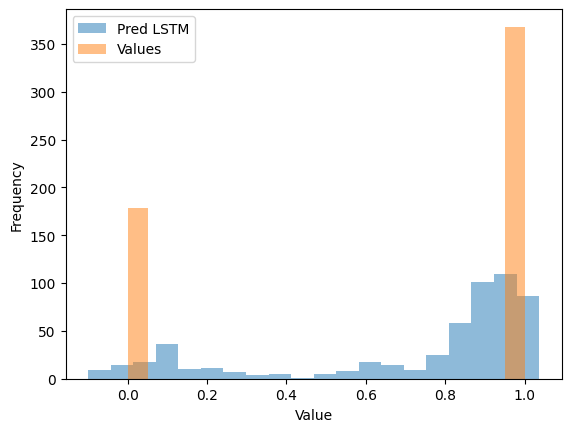

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df_predictions['Pred LSTM'], bins=20, alpha=0.5, label='Pred LSTM')
plt.hist(df_predictions['values'], bins=20, alpha=0.5, label='Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()

<Axes: title={'center': 'Prediction of LSTM over time'}>

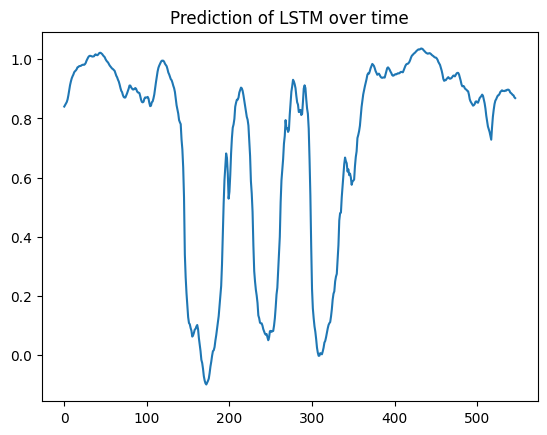

In [ ]:
df_predictions['Pred LSTM'].plot(title='Prediction of LSTM over time')

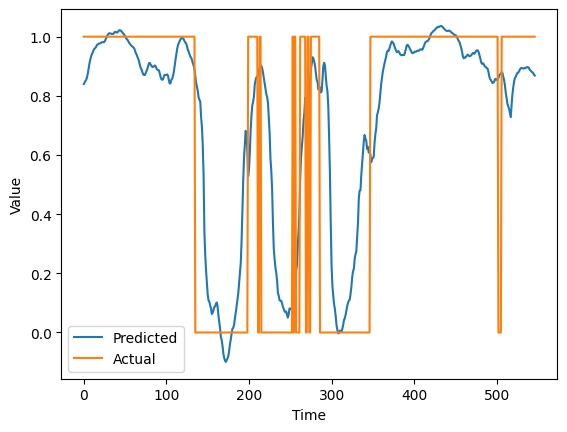

In [ ]:
import matplotlib.pyplot as plt
plt.plot(df_predictions['Pred LSTM'], label='Predicted')
plt.plot(df_predictions['values'], label='Actual')
plt.xlabel('Time')
plt.ylabel('Value')
_ = plt.legend()

**bold text**# Step 2

# MLP

# a)

In [ ]:
df

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2018-01-19,-0.004473,0.038612,0.133471,0.099858,0.177143,0.314957,1
2018-01-22,-0.008215,0.027079,0.119300,0.095610,0.174086,0.297216,1
2018-01-23,0.000226,0.027596,0.123934,0.103394,0.165462,0.293561,1
2018-01-24,-0.016057,0.001424,0.101478,0.095947,0.103162,0.274575,1
2018-01-25,-0.018012,-0.030569,0.048227,0.067853,0.095182,0.258788,1
...,...,...,...,...,...,...,...
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,1
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,1
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,1


In [ ]:
# shift(-1) is used to alleviate data leakage in the MLP model:
df["Ret120"] = df["Ret120_i"].shift(-120)
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
df = df.dropna()
df.tail(10)

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2023-12-15,-0.002729,0.079856,0.127488,0.103230,0.049254,0.458068,0
2023-12-18,-0.008540,0.049661,0.114000,0.095919,0.034401,0.439183,0
2023-12-19,0.005346,0.063636,0.111990,0.102283,0.037953,0.455262,0
2023-12-20,-0.010772,0.038667,0.124913,0.082143,0.004336,0.408160,0
2023-12-21,-0.000770,0.034859,0.133091,0.092646,0.011382,0.403290,0
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,0
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,0
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,0
2023-12-28,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663,0


In [ ]:
print(len(df))

1497


splitting training and test sets by 500 obesrvations respectively, taking 1000 observations in total till the end of observations

In [ ]:
ts = int(0.5* len(df[497:]))
split_time = len(df) - ts  # From this data we are in the test sample
test_time = df.iloc[split_time:, 0:1].values  # Keep the test sample dates
Ret_vector = df.iloc[split_time:, 1:2].values
df.tail()

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,0
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,0
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,0
2023-12-28,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663,0
2023-12-29,-0.005439,0.006349,0.103177,0.082774,0.023300,0.348456,0


In [ ]:
df['Ret']

Date
2018-01-19   -0.004473
2018-01-22   -0.008215
2018-01-23    0.000226
2018-01-24   -0.016057
2018-01-25   -0.018012
                ...   
2023-12-22   -0.005563
2023-12-26   -0.002845
2023-12-27    0.000518
2023-12-28    0.002224
2023-12-29   -0.005439
Name: Ret, Length: 1497, dtype: float64

In [ ]:
Xdf, ydf = df.iloc[497:1497, 1:-1], df.iloc[497:, -1]
X = Xdf.astype('float32')
y = ydf.astype('float32')

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=ts, shuffle=False
)  # It is important to keep "shuffle=False"
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(500, 5) (500, 5) (500,) (500,)


In [ ]:
SEED = 1234
import tensorflow as tf


act_fun = "relu"
hp_units = 45
hp_units_2 = 25
hp_units_3 = 15
n_dropout = 0.2

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(units=hp_units, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_2, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_3, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

hp_lr = 1e-5  # Learning rate

adam = tf.keras.optimizers.Adam(learning_rate=hp_lr)  # Adam optimizer

model.compile(optimizer=adam, loss="binary_crossentropy", metrics=["accuracy"])

In [ ]:
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    patience=20,
    restore_best_weights=True,
)

In [ ]:
class_weight = {0: (np.mean(y_train)/0.5)*1.2, 1:1}
class_weight

{0: 2.188800001144409, 1: 1}

In [ ]:
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    epochs=1000,
    batch_size=64,
    verbose=2,
    callbacks=[es],
    class_weight=class_weight,
)

Epoch 1/1000
7/7 - 1s - loss: 0.7374 - accuracy: 0.3850 - val_loss: 0.6919 - val_accuracy: 0.5000 - 1s/epoch - 192ms/step
Epoch 2/1000
7/7 - 0s - loss: 0.7376 - accuracy: 0.3750 - val_loss: 0.6917 - val_accuracy: 0.5100 - 47ms/epoch - 7ms/step
Epoch 3/1000
7/7 - 0s - loss: 0.7376 - accuracy: 0.3575 - val_loss: 0.6915 - val_accuracy: 0.5300 - 61ms/epoch - 9ms/step
Epoch 4/1000
7/7 - 0s - loss: 0.7363 - accuracy: 0.3825 - val_loss: 0.6913 - val_accuracy: 0.5300 - 44ms/epoch - 6ms/step
Epoch 5/1000
7/7 - 0s - loss: 0.7351 - accuracy: 0.4100 - val_loss: 0.6911 - val_accuracy: 0.5400 - 45ms/epoch - 6ms/step
Epoch 6/1000
7/7 - 0s - loss: 0.7260 - accuracy: 0.4400 - val_loss: 0.6909 - val_accuracy: 0.5500 - 42ms/epoch - 6ms/step
Epoch 7/1000
7/7 - 0s - loss: 0.7316 - accuracy: 0.3975 - val_loss: 0.6907 - val_accuracy: 0.5700 - 57ms/epoch - 8ms/step
Epoch 8/1000
7/7 - 0s - loss: 0.7368 - accuracy: 0.4100 - val_loss: 0.6905 - val_accuracy: 0.5800 - 59ms/epoch - 8ms/step
Epoch 9/1000
7/7 - 0s - 

In [ ]:
y_prob = model.predict(X_test)
y_pred = np.where(y_prob > 0.50, 1, 0)

acc = model.evaluate(X_test, y_test)
print("Model accuracy in test: ", acc)

16/16 [==============================] - 0s 2ms/step - loss: 0.6985 - accuracy: 0.3340
Model accuracy in test:  [0.6985388994216919, 0.33399999141693115]


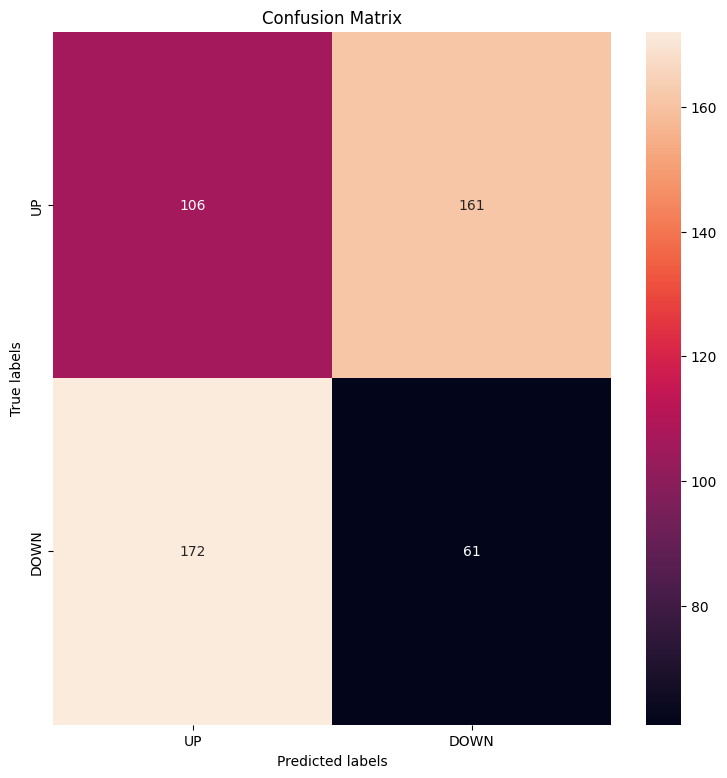

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9, 9))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt="g", ax=ax)
# annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["UP", "DOWN"])
ax.yaxis.set_ticklabels(["UP", "DOWN"]);

In [ ]:
from sklearn.metrics import classification_report


print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.38      0.40      0.39       267
         1.0       0.27      0.26      0.27       233

    accuracy                           0.33       500
   macro avg       0.33      0.33      0.33       500
weighted avg       0.33      0.33      0.33       500



#B) Non-Anchored Random Walk for MLP model:

In [ ]:
X, y = df.iloc[:1500, 1:-1], df.iloc[:1500, -1]
print(X.shape, y.shape)

(1497, 5) (1497,)


In [ ]:
hp_units = 85
hp_units_2 = 55
hp_units_3 = 30
n_dropout = 0.2
act_fun = "relu"

In [ ]:
n_train = 500
n_test = 500

time_backtest = []
time_backtest = np.array(time_backtest)
time_backtest = time_backtest.astype("datetime64", copy=False)

pred_backtest = []
ret_backtest = []

for i in range(0, len(y) - n_train, n_test):
    X_train, X_test = X[i : i + (n_train)], X[i + n_train : i + n_train + n_test]
    y_train, y_test = y[i : i + (n_train)], y[i + n_train : i + n_train + n_test]
    test_time = df.iloc[i + (n_train) : i + n_train + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train) : i + n_train + n_test, 1:2].values
    print(
        "ite ",
        i / n_test,
        " -- start test:",
        test_time[0],
        " -- end test",
        test_time[-1],
        " ------- ",
        X_train.shape,
        y_train.shape,
        X_test.shape,
        y_test.shape,
        test_time.shape,
        Ret_vector.shape,
    )

    tf.keras.backend.clear_session()
    tf.random.set_seed(1234)

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(units=hp_units, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=hp_units_2, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=hp_units_3, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    hp_lr = 1e-5

    adam = tf.keras.optimizers.Adam(learning_rate=hp_lr)
    model.compile(optimizer=adam, loss="binary_crossentropy", metrics=["accuracy"])

    es = tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        mode="max",
        verbose=0,
        patience=20,
        restore_best_weights=True,
    )
    class_weight = {0: (np.mean(y_train) / 0.5), 1: 1}
    history = model.fit(
        X_train,
        y_train,
        validation_split=0.15,
        epochs=500,
        batch_size=32,
        verbose=0,
        callbacks=[es],
        class_weight=class_weight,
    )

    y_prob = model.predict(X_test, verbose=0)
    y_pred = np.where(y_prob > 0.50, 1, 0)


    pred_backtest = np.append(pred_backtest, y_pred.flatten())
    ret_backtest = np.append(ret_backtest, Ret_vector.flatten())



ite  0.0  -- start test: [-0.00429473]  -- end test [-0.01683424]  -------  (500, 5) (500,) (500, 5) (500,) (500, 1) (500, 1)
ite  1.0  -- start test: [0.00098787]  -- end test [-0.00543889]  -------  (500, 5) (500,) (497, 5) (497,) (497, 1) (497, 1)


In [ ]:
y_prob = model.predict(X_test)
y_pred = np.where(y_prob > 0.50, 1, 0)

acc = model.evaluate(X_test, y_test)
print("Model accuracy in test: ", acc)


16/16 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.4789
Model accuracy in test:  [0.6931506991386414, 0.47887325286865234]


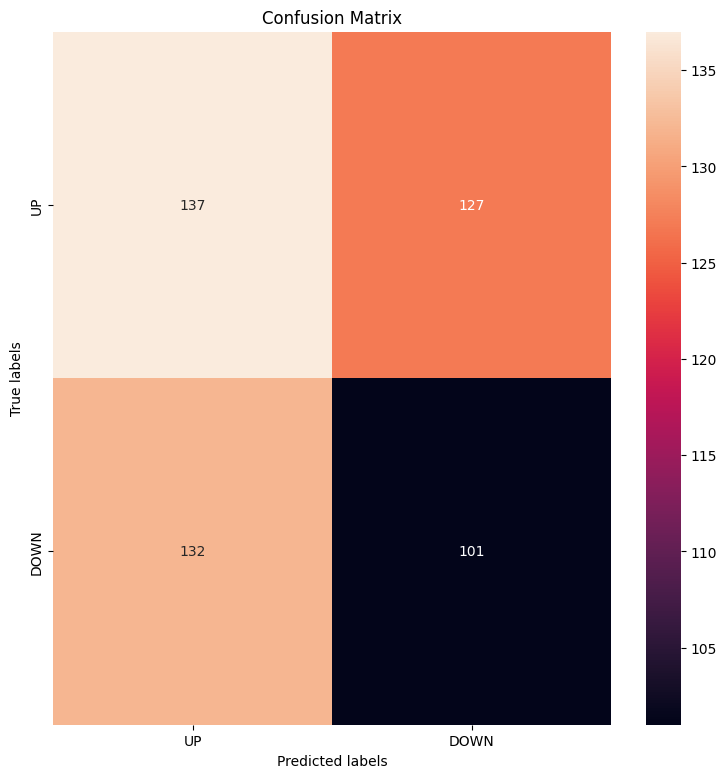

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9, 9))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt="g", ax=ax)
# annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["UP", "DOWN"])
ax.yaxis.set_ticklabels(["UP", "DOWN"]);

In [ ]:
from sklearn.metrics import classification_report

In [ ]:



print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.51      0.52      0.51       264
           1       0.44      0.43      0.44       233

    accuracy                           0.48       497
   macro avg       0.48      0.48      0.48       497
weighted avg       0.48      0.48      0.48       497



a)

a) taking 600 observations till the end of sample and splitting train and test sets by 500 & 100 observations respectively.

In [ ]:
ts = int((1/6)* len(df[897:]))
split_time = len(df) - ts
test_time = df.iloc[split_time:, 0:1].values
Ret_vector = df.iloc[split_time:, 1:2].values
df.tail()

,Ret,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,,
2023-12-22,-0.005563,0.020291,0.125994,0.092054,0.011708,0.393240,0
2023-12-26,-0.002845,0.017551,0.120100,0.103884,0.006357,0.369415,0
2023-12-27,0.000518,0.008832,0.105876,0.101587,0.012784,0.370536,0
2023-12-28,0.002224,0.015297,0.115912,0.096099,0.025926,0.362663,0
2023-12-29,-0.005439,0.006349,0.103177,0.082774,0.023300,0.348456,0


In [ ]:
Xdf, ydf = df.iloc[897:, 1:-1], df.iloc[897:, -1]
X = Xdf.astype('float32')
y = ydf.astype('float32')

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=ts, shuffle=False
)  # It is important to keep "shuffle=False"
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(500, 5) (100, 5) (500,) (100,)


In [ ]:
SEED = 1234
import tensorflow as tf


act_fun = "relu"
hp_units = 45
hp_units_2 = 25
hp_units_3 = 15
n_dropout = 0.2

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(units=hp_units, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_2, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=hp_units_3, activation=act_fun))
model.add(tf.keras.layers.Dropout(n_dropout))
model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

hp_lr = 1e-5  # Learning rate

adam = tf.keras.optimizers.Adam(learning_rate=hp_lr)  # Adam optimizer

model.compile(optimizer=adam, loss="binary_crossentropy", metrics=["accuracy"])

In [ ]:
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    patience=20,
    restore_best_weights=True,
)

In [ ]:
class_weight = {0: (np.mean(y_train)/0.5)*1.2, 1:1}
class_weight

{0: 1.4447999954223631, 1: 1}

In [ ]:
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    epochs=1000,
    batch_size=64,
    verbose=2,
    callbacks=[es],
    class_weight=class_weight,
)

Epoch 1/1000
7/7 - 1s - loss: 0.8241 - accuracy: 0.5825 - val_loss: 0.6912 - val_accuracy: 0.5200 - 1s/epoch - 196ms/step
Epoch 2/1000
7/7 - 0s - loss: 0.8227 - accuracy: 0.5750 - val_loss: 0.6913 - val_accuracy: 0.5100 - 62ms/epoch - 9ms/step
Epoch 3/1000
7/7 - 0s - loss: 0.8238 - accuracy: 0.5675 - val_loss: 0.6914 - val_accuracy: 0.5100 - 61ms/epoch - 9ms/step
Epoch 4/1000
7/7 - 0s - loss: 0.8223 - accuracy: 0.5950 - val_loss: 0.6914 - val_accuracy: 0.5100 - 62ms/epoch - 9ms/step
Epoch 5/1000
7/7 - 0s - loss: 0.8237 - accuracy: 0.5650 - val_loss: 0.6915 - val_accuracy: 0.5100 - 61ms/epoch - 9ms/step
Epoch 6/1000
7/7 - 0s - loss: 0.8235 - accuracy: 0.5875 - val_loss: 0.6916 - val_accuracy: 0.5100 - 62ms/epoch - 9ms/step
Epoch 7/1000
7/7 - 0s - loss: 0.8245 - accuracy: 0.5550 - val_loss: 0.6916 - val_accuracy: 0.5100 - 43ms/epoch - 6ms/step
Epoch 8/1000
7/7 - 0s - loss: 0.8244 - accuracy: 0.5600 - val_loss: 0.6916 - val_accuracy: 0.5100 - 42ms/epoch - 6ms/step
Epoch 9/1000
7/7 - 0s - 

In [ ]:
y_prob = model.predict(X_test)
y_pred = np.where(y_prob > 0.50, 1, 0)

acc = model.evaluate(X_test, y_test)
print("Model accuracy in test: ", acc)

4/4 [==============================] - 0s 3ms/step - loss: 0.6889 - accuracy: 0.7300
Model accuracy in test:  [0.6889140605926514, 0.7300000190734863]


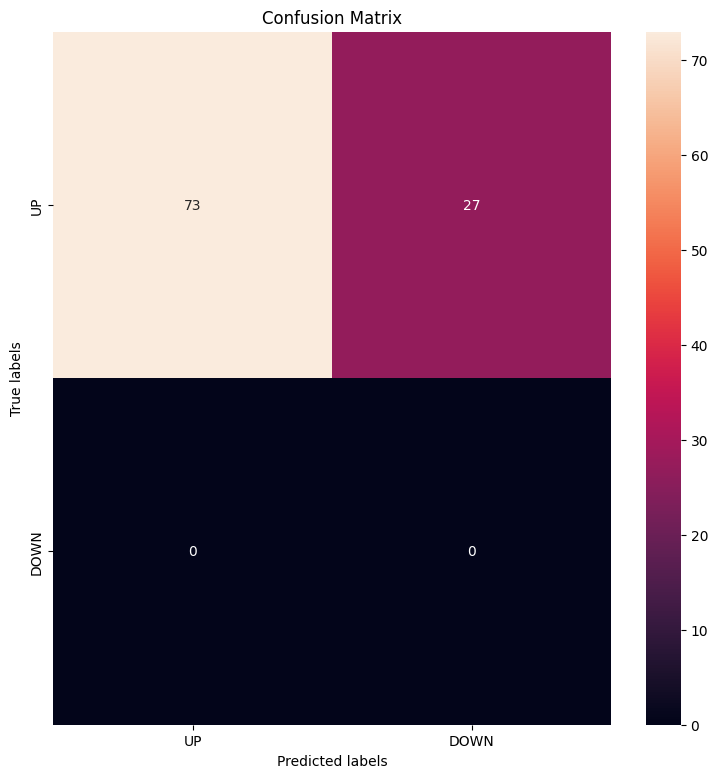

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9, 9))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt="g", ax=ax)
# annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["UP", "DOWN"])
ax.yaxis.set_ticklabels(["UP", "DOWN"]);

In [ ]:
from sklearn.metrics import classification_report


print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.73      0.84       100
         1.0       0.00      0.00      0.00         0

    accuracy                           0.73       100
   macro avg       0.50      0.36      0.42       100
weighted avg       1.00      0.73      0.84       100



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# C)MLP

In [ ]:
X, y = df.iloc[:1500, 1:-1], df.iloc[:1500, -1]
print(X.shape, y.shape)

(1497, 5) (1497,)


In [ ]:
hp_units = 85
hp_units_2 = 55
hp_units_3 = 30
n_dropout = 0.2
act_fun = "relu"

In [ ]:
n_train = 500
n_test = 100

time_backtest = []
time_backtest = np.array(time_backtest)
time_backtest = time_backtest.astype("datetime64", copy=False)

pred_backtest = []
ret_backtest = []

for i in range(0, len(y) - n_train, n_test):
    X_train, X_test = X[i : i + (n_train)], X[i + n_train : i + n_train + n_test]
    y_train, y_test = y[i : i + (n_train)], y[i + n_train : i + n_train + n_test]
    test_time = df.iloc[i + (n_train) : i + n_train + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train) : i + n_train + n_test, 1:2].values
    print(
        "ite ",
        i / n_test,
        " -- start test:",
        test_time[0],
        " -- end test",
        test_time[-1],
        " ------- ",
        X_train.shape,
        y_train.shape,
        X_test.shape,
        y_test.shape,
        test_time.shape,
        Ret_vector.shape,
    )

    tf.keras.backend.clear_session()
    tf.random.set_seed(1234)

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(units=hp_units, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=hp_units_2, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=hp_units_3, activation=act_fun))
    model.add(tf.keras.layers.Dropout(n_dropout))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    hp_lr = 1e-5

    adam = tf.keras.optimizers.Adam(learning_rate=hp_lr)
    model.compile(optimizer=adam, loss="binary_crossentropy", metrics=["accuracy"])

    es = tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        mode="max",
        verbose=0,
        patience=20,
        restore_best_weights=True,
    )
    class_weight = {0: (np.mean(y_train) / 0.5), 1: 1}
    history = model.fit(
        X_train,
        y_train,
        validation_split=0.15,
        epochs=500,
        batch_size=32,
        verbose=0,
        callbacks=[es],
        class_weight=class_weight,
    )

    y_prob = model.predict(X_test, verbose=0)
    y_pred = np.where(y_prob > 0.50, 1, 0)


    pred_backtest = np.append(pred_backtest, y_pred.flatten())
    ret_backtest = np.append(ret_backtest, Ret_vector.flatten())



ite  0.0  -- start test: [-0.00429473]  -- end test [0.00589508]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  1.0  -- start test: [0.03108967]  -- end test [-0.04741891]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  2.0  -- start test: [0.03638052]  -- end test [-0.02019608]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  3.0  -- start test: [0.0041549]  -- end test [0.01345693]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  4.0  -- start test: [-0.00617302]  -- end test [-0.01683424]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  5.0  -- start test: [0.00098787]  -- end test [-0.00087373]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  6.0  -- start test: [0.0166715]  -- end test [0.0146942]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  7.0  -- start test: [0.01915297]  -- end test [0.01536518]  -------  (500, 5) (500,) (100, 5) (100,) (100, 1) (100, 1)
ite  

In [ ]:
y_prob = model.predict(X_test)
y_pred = np.where(y_prob > 0.50, 1, 0)

acc = model.evaluate(X_test, y_test)
print("Model accuracy in test: ", acc)

4/4 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.2887
Model accuracy in test:  [0.6970505714416504, 0.2886597812175751]


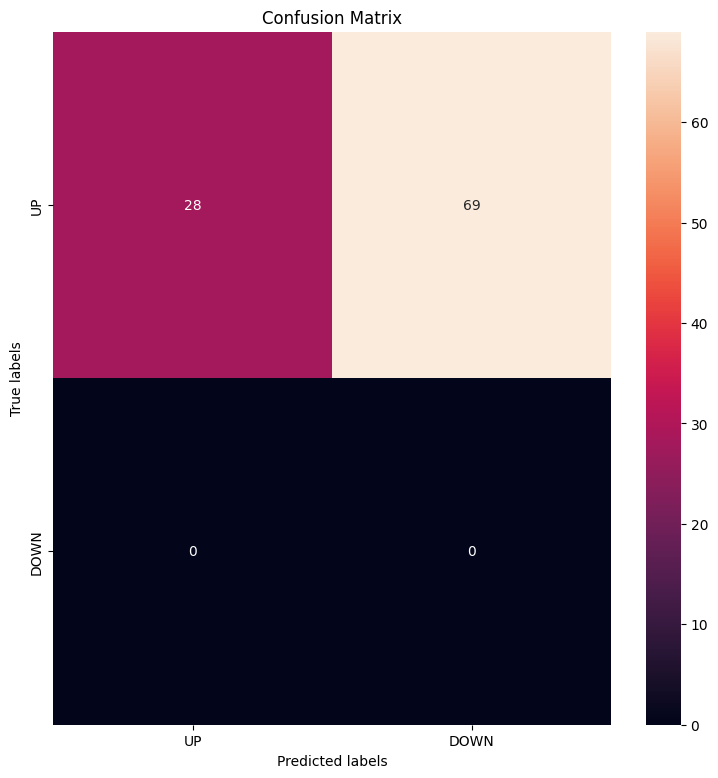

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9, 9))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt="g", ax=ax)
# annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["UP", "DOWN"])
ax.yaxis.set_ticklabels(["UP", "DOWN"]);

GAF

# a) Choosing a window of 120 from returns themselves not the 120 returns' ones

---



# splitting observations such that 500 ones in train set and 500 ones in test set, window size is 120

(1240,)


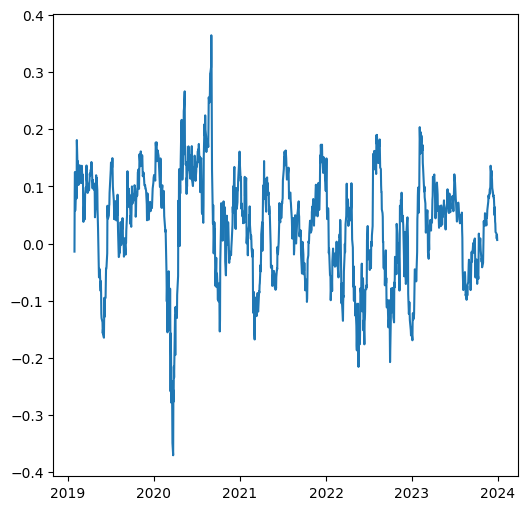

In [ ]:
Xdf = df.iloc[257:, 1]
print(Xdf.shape)
plt.figure(figsize=(6, 6))
plt.plot(Xdf)

(1120, 120)


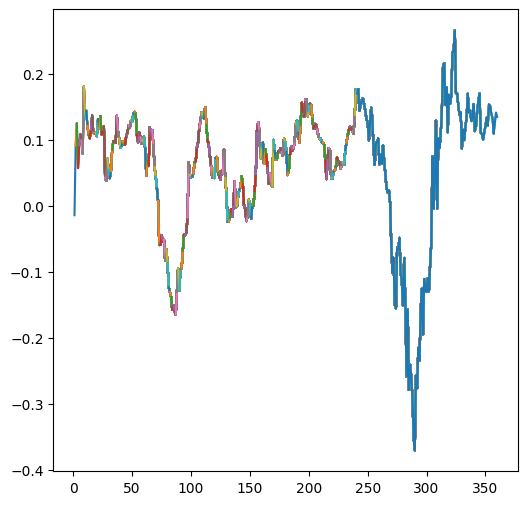

In [ ]:
X_train = []
window_size = 120
for i in range(window_size, Xdf.shape[0]):
    X_train.append(Xdf[i - window_size : i])
X_train = np.array(X_train)
print(X_train.shape)
# Define a "window_size"-days interval
days = np.linspace(1, X_train.shape[0], num=X_train.shape[0])
# Plot the overlapping time series
plt.figure(figsize=(6, 6))
for i in range(241):
    plt.plot(days[i : window_size + i], X_train[i, :])

In [ ]:
transformer = GramianAngularField()
X_train_new = transformer.transform(X_train)
print(X_train_new.shape)

(1120, 120, 120)


(120, 120)


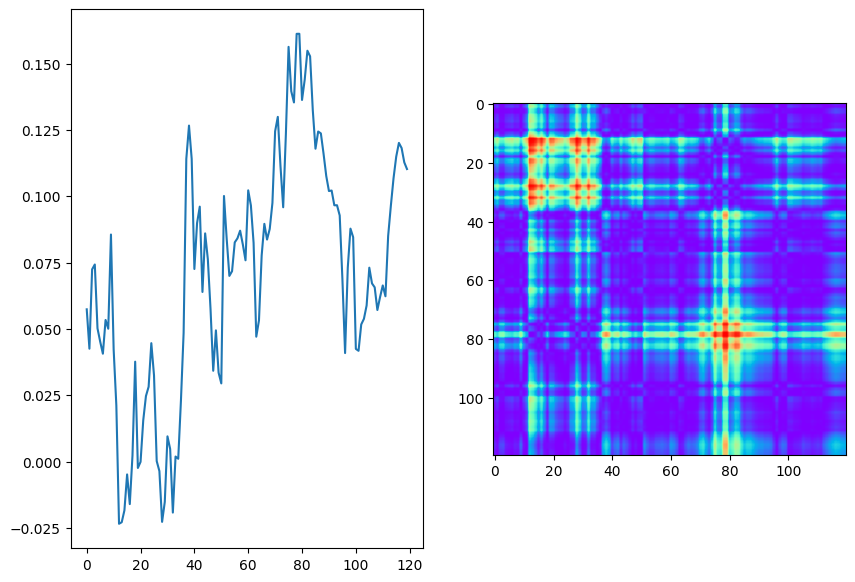

In [ ]:
# Show the results for the 118th time series
fig, ax = plt.subplots(1, 2, figsize=(10, 7), gridspec_kw={"width_ratios": [1, 1]})
ax[0].plot(X_train[118, :])
ax[1].imshow(X_train_new[118], cmap="rainbow")
print(X_train_new[118].shape)

In [ ]:
# Generate the labels: 1 if price goes up after window_size days, 0 otherwise
y_data = []
for i in range(window_size, Xdf.shape[0] - window_size):
    y_data.append(Xdf[i] < Xdf[i + window_size])
y_data = np.array(y_data)
y_data.shape

(1000,)

In [ ]:
# Determine the examples to be used as inputs in the model and rescale them to the [0,255] scale
X_data = X_train_new[:-window_size]
for i in range(X_data.shape[0]):
    X_data[i] = (X_data[i] - np.min(X_data[i])) / (
        np.max(X_data[i]) - np.min(X_data[i])
    )
# We could simply write X_data = (X_data + 1)/2
X_data = X_data * 255
X_data.shape

(1000, 120, 120)

In [ ]:
# Split into train and test
train_split = 0.5
y_data_train = y_data[:int(train_split * y_data.shape[0])]
y_data_test = y_data[int(train_split * y_data.shape[0]) :]
X_data_train = X_data[:int(train_split * y_data.shape[0])]
X_data_test = X_data[int(train_split * y_data.shape[0]) :]

In [ ]:
y_data_test.shape

(500,)

In [ ]:
y_data_train = y_data_train.astype('float32')
y_data_test = y_data_test.astype('float32')
X_data_train = X_data_train.astype('float32')
X_data_test = X_data_test.astype('float32')

In [ ]:
model = tf.keras.Sequential()
# Input layer
model.add(tf.keras.layers.InputLayer(input_shape=(120, 120, 1)))
model.add(tf.keras.layers.Conv2D(61, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(30.5, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(15.25, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(930.25, activation="relu"))
model.add(tf.keras.layers.Dropout(0.5, seed=1234))
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 118, 118, 61)      610       
                                                                 
 max_pooling2d (MaxPooling2  (None, 59, 59, 61)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 57, 57, 30)        16500     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 28, 28, 30)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 26, 26, 15)        4065      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 13, 13, 15)       

In [ ]:
# setting mode to maximum for better optimization
model.compile(loss="binary_crossentropy", optimizer="RMSprop", metrics=["accuracy"])
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "model.h5", monitor="val_accuracy", save_best_only=True, mode="max"
)
class_weight = {0: 1 / (1 - np.mean(y_data_train)), 1: 1.0}
print(class_weight)

{0: 2.083333250549108, 1: 1.0}


In [ ]:

model.fit(
    x=X_data_train,
    y=y_data_train,
    epochs=25,
    validation_data=(X_data_test, y_data_test),
    verbose=1,
    callbacks=[checkpoint],
    class_weight=class_weight,
)

Epoch 1/25
16/16 [==============================] - 19s 1s/step - loss: 18.0118 - accuracy: 0.5580 - val_loss: 0.7897 - val_accuracy: 0.5000
Epoch 2/25


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


16/16 [==============================] - 16s 998ms/step - loss: 0.6005 - accuracy: 0.8080 - val_loss: 0.9445 - val_accuracy: 0.4640
Epoch 3/25
16/16 [==============================] - 18s 1s/step - loss: 0.4967 - accuracy: 0.8600 - val_loss: 0.9363 - val_accuracy: 0.4760
Epoch 4/25
16/16 [==============================] - 16s 1s/step - loss: 0.2394 - accuracy: 0.9420 - val_loss: 1.5753 - val_accuracy: 0.5320
Epoch 5/25
16/16 [==============================] - 16s 1s/step - loss: 0.3843 - accuracy: 0.9080 - val_loss: 0.9264 - val_accuracy: 0.4960
Epoch 6/25
16/16 [==============================] - 16s 1s/step - loss: 0.2815 - accuracy: 0.9220 - val_loss: 1.5639 - val_accuracy: 0.5200
Epoch 7/25
16/16 [==============================] - 16s 1s/step - loss: 0.1941 - accuracy: 0.9600 - val_loss: 1.7696 - val_accuracy: 0.5100
Epoch 8/25
16/16 [==============================] - 18s 1s/step - loss: 0.4439 - accuracy: 0.9180 - val_loss: 1.8025 - val_accuracy: 0.5300
Epoch 9/25
16/16 [==========

In [ ]:
model = tf.keras.models.load_model("model.h5")
acc = model.evaluate(x=X_data_test, y=y_data_test)
print("Accuracy over validation: {:.2f}%".format(acc[1] * 100))

16/16 [==============================] - 4s 252ms/step - loss: 2.4813 - accuracy: 0.5620
Accuracy over validation: 56.20%


16/16 [==============================] - 3s 193ms/step
              precision    recall  f1-score   support

         0.0       0.59      0.53      0.56       264
         1.0       0.53      0.59      0.56       236

    accuracy                           0.56       500
   macro avg       0.56      0.56      0.56       500
weighted avg       0.57      0.56      0.56       500



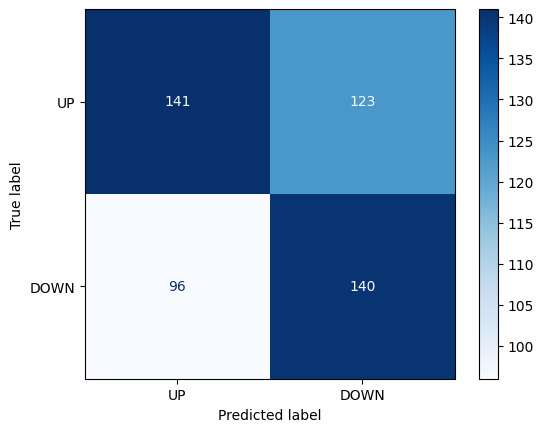

In [ ]:
y_prob = model.predict(X_data_test)
y_pred = np.round(y_prob)
cm = metrics.confusion_matrix(y_data_test, y_pred)
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["UP", "DOWN"])
cm.plot(values_format="", cmap="Blues")
print(classification_report(y_data_test, y_pred))

# splitting observations to be 500 ones in train and 100 ones in test till the end of sample, window size is 120

(840,)


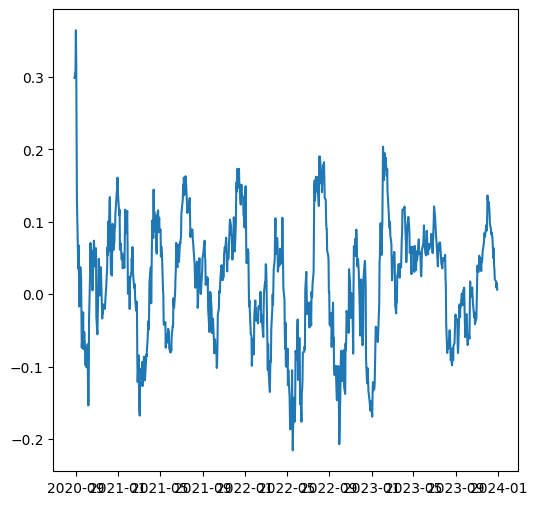

In [ ]:
Xdf = df.iloc[657:, 1]
print(Xdf.shape)
plt.figure(figsize=(6, 6))
plt.plot(Xdf)

(720, 120)


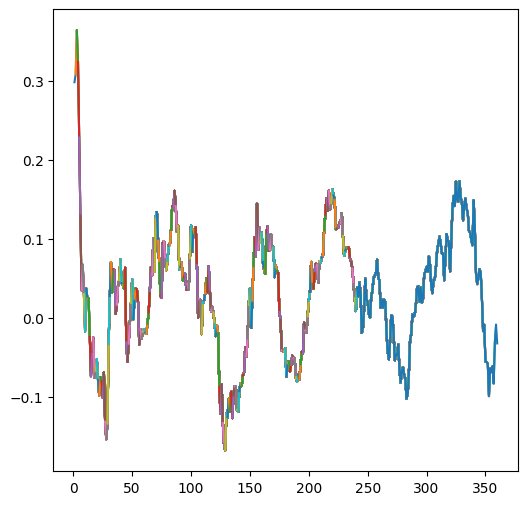

In [ ]:
X_train = []
window_size = 120
for i in range(window_size, Xdf.shape[0]):
    X_train.append(Xdf[i - window_size : i])
X_train = np.array(X_train)
print(X_train.shape)
# Define a "window_size"-days interval
days = np.linspace(1, X_train.shape[0], num=X_train.shape[0])
# Plot the overlapping time series
plt.figure(figsize=(6, 6))
for i in range(241):
    plt.plot(days[i : window_size + i], X_train[i, :])

In [ ]:
transformer = GramianAngularField()
X_train_new = transformer.transform(X_train)
print(X_train_new.shape)

(720, 120, 120)


In [ ]:
y_data = []
for i in range(window_size, Xdf.shape[0] - window_size):
    y_data.append(Xdf[i] < Xdf[i + window_size])
y_data = np.array(y_data)
y_data.shape

(600,)

In [ ]:
X_data = X_train_new[:-window_size]
for i in range(X_data.shape[0]):
    X_data[i] = (X_data[i] - np.min(X_data[i])) / (
        np.max(X_data[i]) - np.min(X_data[i])
    )
# We could simply write X_data = (X_data + 1)/2
X_data = X_data * 255
X_data.shape

(600, 120, 120)

In [ ]:
# Split into train and test
train_split = 5/6
y_data_train = y_data[:int(train_split * y_data.shape[0])]
y_data_test = y_data[int(train_split * y_data.shape[0]) :]
X_data_train = X_data[:int(train_split * y_data.shape[0])]
X_data_test = X_data[int(train_split * y_data.shape[0]) :]

In [ ]:
y_data_train.shape

(500,)

In [ ]:
y_data_test.shape

(100,)

In [ ]:
y_data_train = y_data_train.astype('float32')
y_data_test = y_data_test.astype('float32')
X_data_train = X_data_train.astype('float32')
X_data_test = X_data_test.astype('float32')

In [ ]:
model = tf.keras.Sequential()
# Input layer
model.add(tf.keras.layers.InputLayer(input_shape=(120, 120, 1)))
model.add(tf.keras.layers.Conv2D(61, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(30.5, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(15.25, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(930.25, activation="relu"))
model.add(tf.keras.layers.Dropout(0.5, seed=1234))
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 118, 118, 61)      610       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 59, 59, 61)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 57, 57, 30)        16500     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 28, 28, 30)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 26, 26, 15)        4065      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 13, 13, 15)       

In [ ]:
# setting mode to maximum for better optimization
model.compile(loss="binary_crossentropy", optimizer="RMSprop", metrics=["accuracy"])
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "model.h5", monitor="val_accuracy", save_best_only=True, mode="max"
)
class_weight = {0: 1 / (1 - np.mean(y_data_train)), 1: 1.0}
print(class_weight)

{0: 2.3255813566654555, 1: 1.0}


In [ ]:
model.fit(
    x=X_data_train,
    y=y_data_train,
    epochs=25,
    validation_data=(X_data_test, y_data_test),
    verbose=0,
    callbacks=[checkpoint],
    class_weight=class_weight,
)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = tf.keras.models.load_model("model.h5")
acc = model.evaluate(x=X_data_test, y=y_data_test)
print("Accuracy over validation: {:.2f}%".format(acc[1] * 100))

4/4 [==============================] - 1s 142ms/step - loss: 1.6288 - accuracy: 0.7800
Accuracy over validation: 78.00%


4/4 [==============================] - 1s 142ms/step
              precision    recall  f1-score   support

         0.0       0.80      0.96      0.88        81
         1.0       0.00      0.00      0.00        19

    accuracy                           0.78       100
   macro avg       0.40      0.48      0.44       100
weighted avg       0.65      0.78      0.71       100



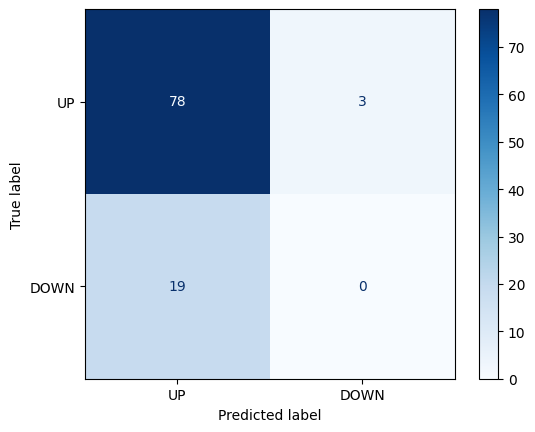

In [ ]:
y_prob = model.predict(X_data_test)
y_pred = np.round(y_prob)
cm = metrics.confusion_matrix(y_data_test, y_pred)
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["UP", "DOWN"])
cm.plot(values_format="", cmap="Blues")
print(classification_report(y_data_test, y_pred))

# b)GAF

In [ ]:
start_date = '2017-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-02-06,32.282501,32.625000,32.224998,32.572498,30.274916,107383600
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563051,152735200
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681555,92016400
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903257,113399600
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833244,80262000
...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700


In [ ]:
df= data

In [ ]:
df['ret'] = df['Close'].pct_change()

In [ ]:
df = df.dropna()
df

,Open,High,Low,Close,Adj Close,Volume,ret
Date,,,,,,,
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563051,152735200,0.009517
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681555,92016400,0.003877
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903257,113399600,0.002878
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833244,80262000,-0.002266
2017-02-13,33.270000,33.455002,33.187500,33.322498,31.106298,92141600,0.008856
...,...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800,-0.005547
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300,-0.002841
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700,0.000518


In [ ]:
del df['Close']
del df['Open']
del df['Adj Close']
del df['High']
del df['Low']
df

,Volume,ret
Date,,
2017-02-07,152735200,0.009517
2017-02-08,92016400,0.003877
2017-02-09,113399600,0.002878
2017-02-10,80262000,-0.002266
2017-02-13,92141600,0.008856
...,...,...
2023-12-22,37122800,-0.005547
2023-12-26,28919300,-0.002841
2023-12-27,48087700,0.000518


In [ ]:
del df['Volume']
df

,ret
Date,
2017-02-07,0.009517
2017-02-08,0.003877
2017-02-09,0.002878
2017-02-10,-0.002266
2017-02-13,0.008856
...,...
2023-12-22,-0.005547
2023-12-26,-0.002841
2023-12-27,0.000518


(1736,)


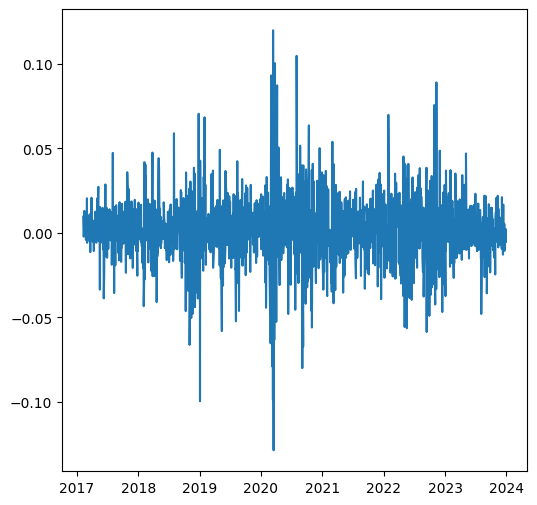

In [ ]:
Xdf = df.iloc[:, 0]
print(Xdf.shape)
plt.figure(figsize=(6, 6))
plt.plot(Xdf)

(1616, 120)


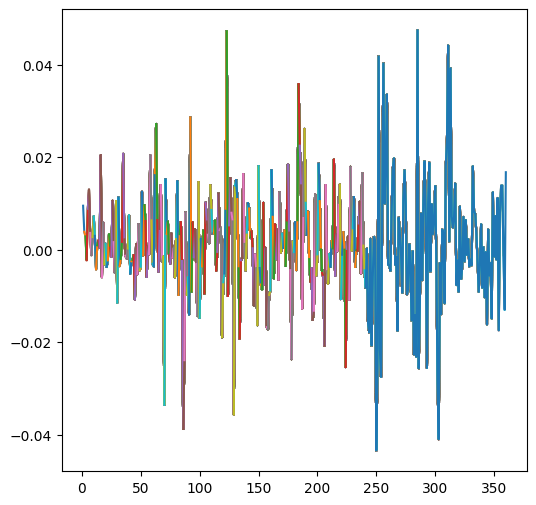

In [ ]:
X_train = []
window_size = 120
for i in range(window_size, Xdf.shape[0]):
    X_train.append(Xdf[i - window_size : i])
X_train = np.array(X_train)
print(X_train.shape)
# Define a "window_size"-days interval
days = np.linspace(1, X_train.shape[0], num=X_train.shape[0])
# Plot the overlapping time series
plt.figure(figsize=(6, 6))
for i in range(241):
    plt.plot(days[i : window_size + i], X_train[i, :])

In [ ]:
transformer = GramianAngularField()
X_train_new = transformer.transform(X_train)
print(X_train_new.shape)

(1616, 120, 120)


In [ ]:
y_data = []
for i in range(window_size, Xdf.shape[0] - window_size):
    y_data.append(Xdf[i] < Xdf[i + window_size])
y_data = np.array(y_data)
y_data.shape

(1496,)

In [ ]:

X_data = X_train_new[:-window_size]
for i in range(X_data.shape[0]):
    X_data[i] = (X_data[i] - np.min(X_data[i])) / (
        np.max(X_data[i]) - np.min(X_data[i])
    )
# We could simply write X_data = (X_data + 1)/2
X_data = X_data * 255
X_data.shape

(1496, 120, 120)

In [ ]:
n_train = 500
n_test = 500



pred_backtest = []
ret_backtest = []

val_split = 0.2




In [ ]:

for i in range(0, len(y_data) - n_train, n_test):
    X_data_train, X_data_test = X_data[i : i + n_train ], X_data[i + n_train : i + n_train + n_test]
    y_data_train, y_data_test = y_data[i : i + n_train ], y_data[i + n_train : i + n_train + n_test]
    test_time = df.iloc[i + (n_train) : i + (n_train) + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train) : i + (n_train) + n_test, 1:2].values

In [ ]:
 print(
        "ite ",
        i / n_test,
        X_data_train.shape,
        y_data_train.shape,
        X_data_test.shape,
        y_data_test.shape,

    )

ite  1.0 (500, 120, 120) (500,) (496, 120, 120) (496,)


In [ ]:
y_data_train = y_data_train.astype('float32')
y_data_test = y_data_test.astype('float32')
X_data_train = X_data_train.astype('float32')
X_data_test = X_data_test.astype('float32')

In [ ]:
model = tf.keras.Sequential()
# Input layer
model.add(tf.keras.layers.InputLayer(input_shape=(120, 120, 1)))
model.add(tf.keras.layers.Conv2D(61, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(30.5, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(15.25, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(930.25, activation="relu"))
model.add(tf.keras.layers.Dropout(0.5, seed=1234))
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 118, 118, 61)      610       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 59, 59, 61)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 57, 57, 30)        16500     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 28, 28, 30)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 26, 26, 15)        4065      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 13, 13, 15)       

In [ ]:
# setting mode to maximum for better optimization
model.compile(loss="binary_crossentropy", optimizer="RMSprop", metrics=["accuracy"])
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "model.h5", monitor="val_accuracy", save_best_only=True, mode="max"
)
class_weight = {0: 1 / (1 - np.mean(y_data_train)), 1: 1.0}
print(class_weight)

{0: 2.024291425679104, 1: 1.0}


In [ ]:
model.fit(
    x=X_data_train,
    y=y_data_train,
    epochs=25,
    validation_data=(X_data_test, y_data_test),
    verbose=0,
    callbacks=[checkpoint],
    class_weight=class_weight,
)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = tf.keras.models.load_model("model.h5")
acc = model.evaluate(x=X_data_test, y=y_data_test)
print("Accuracy over validation: {:.2f}%".format(acc[1] * 100))

16/16 [==============================] - 3s 195ms/step - loss: 1.6651 - accuracy: 0.5302
Accuracy over validation: 53.02%


16/16 [==============================] - 4s 246ms/step
              precision    recall  f1-score   support

         0.0       0.52      0.77      0.62       251
         1.0       0.55      0.29      0.38       245

    accuracy                           0.53       496
   macro avg       0.54      0.53      0.50       496
weighted avg       0.54      0.53      0.50       496



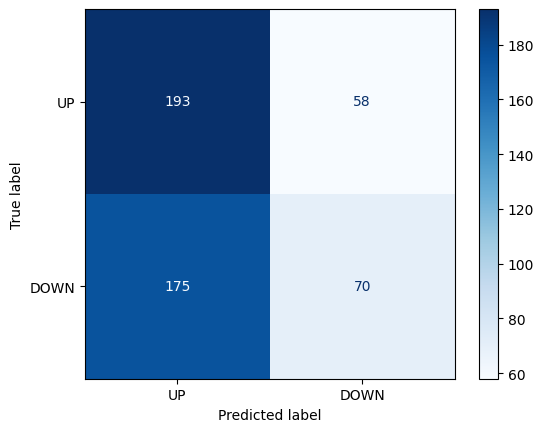

In [ ]:
y_prob = model.predict(X_data_test)
y_pred = np.round(y_prob)
cm = metrics.confusion_matrix(y_data_test, y_pred)
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["UP", "DOWN"])
cm.plot(values_format="", cmap="Blues")
print(classification_report(y_data_test, y_pred))

# C)GAF

In [ ]:
start_date = '2017-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-02-06,32.282501,32.625000,32.224998,32.572498,30.274916,107383600
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563053,152735200
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681557,92016400
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903263,113399600
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833250,80262000
...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700


In [ ]:
df = data

In [ ]:
df['ret'] = df['Close'].pct_change()

In [ ]:
del df['Close']
del df['Open']
del df['Adj Close']
del df['High']
del df['Low']
del df["Volume"]
df= df.dropna()
df

,ret
Date,
2017-02-07,0.009517
2017-02-08,0.003877
2017-02-09,0.002878
2017-02-10,-0.002266
2017-02-13,0.008856
...,...
2023-12-22,-0.005547
2023-12-26,-0.002841
2023-12-27,0.000518


In [ ]:
import numpy as np
import tensorflow as tf

In [ ]:
Xdf = df.iloc[:, 0]
print(Xdf.shape)


(1736,)


(1616, 120)


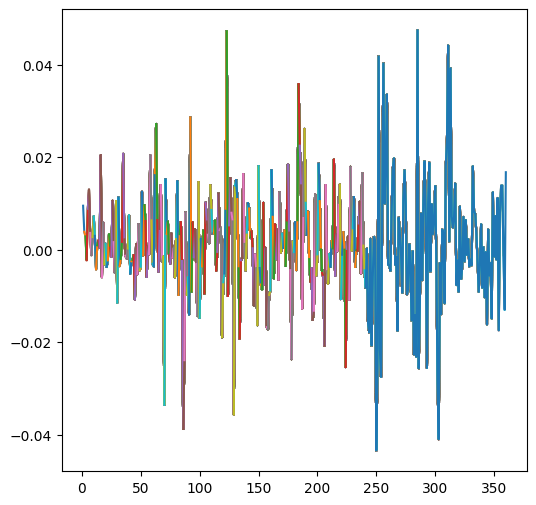

In [ ]:
X_train = []
window_size = 120
for i in range(window_size, Xdf.shape[0]):
    X_train.append(Xdf[i - window_size : i])
X_train = np.array(X_train)
print(X_train.shape)
# Define a "window_size"-days interval
days = np.linspace(1, X_train.shape[0], num=X_train.shape[0])
# Plot the overlapping time series
plt.figure(figsize=(6, 6))
for i in range(241):
    plt.plot(days[i : window_size + i], X_train[i, :])

In [ ]:
transformer = GramianAngularField()
X_train_new = transformer.transform(X_train)
print(X_train_new.shape)

(1616, 120, 120)


In [ ]:
y_data = []
for i in range(window_size, Xdf.shape[0] - window_size):
    y_data.append(Xdf[i] < Xdf[i + window_size])
y_data = np.array(y_data)
y_data.shape

(1496,)

In [ ]:
X_data = X_train_new[:-window_size]
for i in range(X_data.shape[0]):
    X_data[i] = (X_data[i] - np.min(X_data[i])) / (
        np.max(X_data[i]) - np.min(X_data[i])
    )
# We could simply write X_data = (X_data + 1)/2
X_data = X_data * 255
X_data.shape

(1496, 120, 120)

In [ ]:
n_train = 500
n_test = 100



pred_backtest = []
ret_backtest = []

val_split = 0.2




In [ ]:
for i in range(0, len(y_data) - n_train, n_test):
    X_data_train, X_data_test = X_data[i : i + n_train ], X_data[i + n_train : i + n_train + n_test]
    y_data_train, y_data_test = y_data[i : i + n_train ], y_data[i + n_train : i + n_train + n_test]
    test_time = df.iloc[i + (n_train) : i + (n_train) + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train) : i + (n_train) + n_test, 1:2].values

In [ ]:
 print(
        "ite ",
        i / n_test,
        X_data_train.shape,
        y_data_train.shape,
        X_data_test.shape,
        y_data_test.shape,

    )

ite  9.0 (500, 120, 120) (500,) (96, 120, 120) (96,)


In [ ]:
y_data_train = y_data_train.astype('float32')
y_data_test = y_data_test.astype('float32')
X_data_train = X_data_train.astype('float32')
X_data_test = X_data_test.astype('float32')

In [ ]:
y_data_train.shape

(500,)

In [ ]:
model = tf.keras.Sequential()
# Input layer
model.add(tf.keras.layers.InputLayer(input_shape=(120, 120, 1)))
model.add(tf.keras.layers.Conv2D(61, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(30.5, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Conv2D(15.25, 3, activation="relu"))
model.add(tf.keras.layers.MaxPooling2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(930.25, activation="relu"))
model.add(tf.keras.layers.Dropout(0.5, seed=1234))
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 118, 118, 61)      610       
                                                                 
 max_pooling2d (MaxPooling2  (None, 59, 59, 61)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 57, 57, 30)        16500     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 28, 28, 30)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 26, 26, 15)        4065      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 13, 13, 15)        0

In [ ]:
# setting mode to maximum for better optimization
model.compile(loss="binary_crossentropy", optimizer="RMSprop", metrics=["accuracy"])
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "model.h5", monitor="val_accuracy", save_best_only=True, mode="max"
)
class_weight = {0: 1 / (1 - np.mean(y_data_train)), 1: 1.0}
print(class_weight)

{0: 1.9607843503911702, 1: 1.0}


In [ ]:
model.fit(
    x=X_data_train,
    y=y_data_train,
    epochs=25,
    validation_data=(X_data_test, y_data_test),
    verbose=0,
    callbacks=[checkpoint],
    class_weight=class_weight,
)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = tf.keras.models.load_model("model.h5")
acc = model.evaluate(x=X_data_test, y=y_data_test)
print("Accuracy over validation: {:.2f}%".format(acc[1] * 100))

3/3 [==============================] - 1s 212ms/step - loss: 1.0402 - accuracy: 0.5417
Accuracy over validation: 54.17%


3/3 [==============================] - 1s 328ms/step
              precision    recall  f1-score   support

         0.0       0.53      0.92      0.67        49
         1.0       0.64      0.15      0.24        47

    accuracy                           0.54        96
   macro avg       0.58      0.53      0.46        96
weighted avg       0.58      0.54      0.46        96



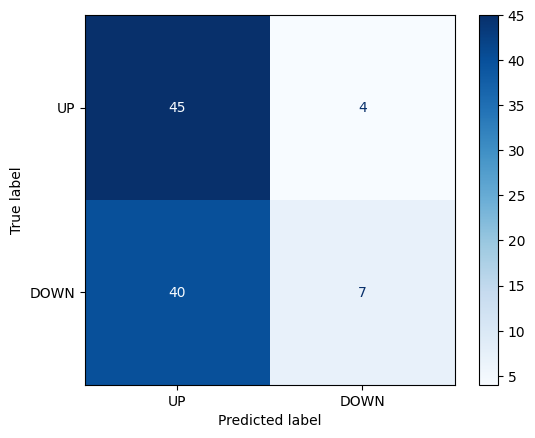

In [ ]:
y_prob = model.predict(X_data_test)
y_pred = np.round(y_prob)
cm = metrics.confusion_matrix(y_data_test, y_pred)
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["UP", "DOWN"])
cm.plot(values_format="", cmap="Blues")
print(classification_report(y_data_test, y_pred))

# Applying Autoencoder modelling technique for image features extraction and recognition for model C:

In [ ]:
from tensorflow.keras.layers import LSTM, Dense, Dropout, Flatten

In [ ]:
print(X_data_train.shape, X_data_test.shape)


(500, 120, 120) (96, 120, 120)


In [ ]:
encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[120,120]),  # Flatten before dense layers
    tf.keras.layers.Dense(100, activation='relu'),  # First hidden layer
    tf.keras.layers.Dense(30, activation='relu'),  # Second hidden layer (bottleneck)
])

decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation='relu', input_shape=[30]),
    tf.keras.layers.Dense(120 * 120, activation='sigmoid'),
    tf.keras.layers.Reshape([120,120])
])

# Combine encoder and decoder
autoencoder = tf.keras.models.Sequential([encoder, decoder])


In [ ]:
# Compile the model
autoencoder.compile(loss='binary_crossentropy', optimizer='adam')  # Adjust loss and optimizer as needed

# Fit the model
autoencoder.fit(X_data_train, X_data_train, epochs=20, validation_data=(X_data_test, X_data_test))



Epoch 1/20
16/16 [==============================] - 3s 101ms/step - loss: -326.5878 - val_loss: -404.1211
Epoch 2/20
16/16 [==============================] - 1s 85ms/step - loss: -385.9301 - val_loss: -404.6090
Epoch 3/20
16/16 [==============================] - 1s 89ms/step - loss: -386.1700 - val_loss: -404.7648
Epoch 4/20
16/16 [==============================] - 2s 103ms/step - loss: -386.1858 - val_loss: -404.7648
Epoch 5/20
16/16 [==============================] - 1s 82ms/step - loss: -386.1858 - val_loss: -404.7648
Epoch 6/20
16/16 [==============================] - 2s 122ms/step - loss: -386.1858 - val_loss: -404.7648
Epoch 7/20
16/16 [==============================] - 2s 109ms/step - loss: -386.1859 - val_loss: -404.7648
Epoch 8/20
16/16 [==============================] - 1s 87ms/step - loss: -386.1859 - val_loss: -404.7648
Epoch 9/20
16/16 [==============================] - 1s 77ms/step - loss: -386.1858 - val_loss: -404.7648
Epoch 10/20
16/16 [==============================] 

In [ ]:
autoencoder.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 30)                1443130   
                                                                 
 sequential_2 (Sequential)   (None, 120, 120)          1457500   
                                                                 
Total params: 2900630 (11.07 MB)
Trainable params: 2900630 (11.07 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:

Y_pred_train = autoencoder.predict(X_data_train)
Y_pred_test = autoencoder.predict(X_data_test)


3/3 [==============================] - 0s 25ms/step


In [ ]:
error= np.sum((X_data_train - Y_pred_train)**2 )/np.sum((X_data_train - np.mean(X_data_train )**2 ))


print("Reconstruction error in training sample", error)

Reconstruction error in training sample -2.8413596


In [ ]:
error_oos =np.sum((X_data_test - Y_pred_test)**2 )/np.sum((X_data_test  - np.mean(X_data_test) )**2 )
print("Reconstruction error in test sample", error_oos)

Reconstruction error in test sample 1.5857129


In [ ]:
# Access the encoder (assuming it's the first part of the model):
encoder = autoencoder.layers[0]

# Extract encoded features:
encoded_data = encoder.predict(X_data_test)


3/3 [==============================] - 0s 12ms/step


In [ ]:

factors_cov = np.cov(encoded_data, rowvar=False)
print(factors_cov)

[[ 3.90626289e+04  0.00000000e+00  2.46011459e+05  0.00000000e+00
   0.00000000e+00  5.89334280e+05  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   1.13445297e+05  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.55235228e+05  0.00000000e+00 -3.70247878e+01
   0.00000000e+00  0.00000000e+00  1.91257970e+04  2.37043457e+05
   0.00000000e+00  0.00000000e+00  1.23263606e+05  0.00000000e+00
   2.58012658e+05  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 2.4

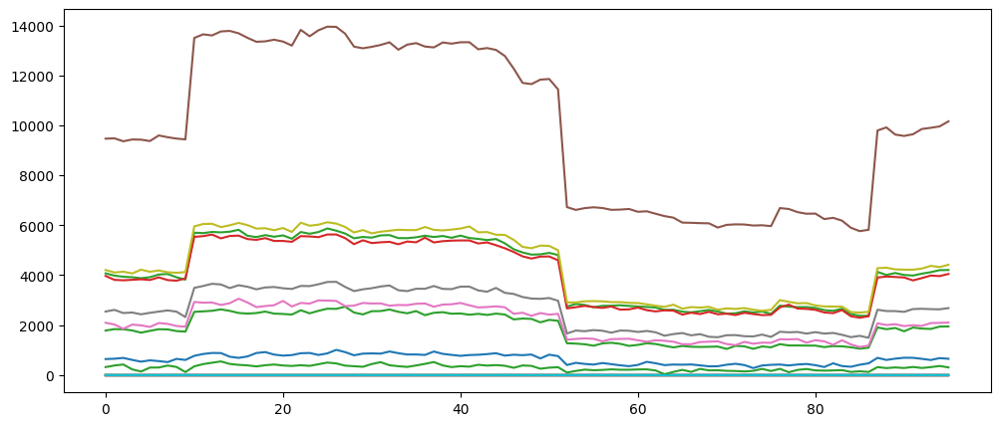

In [ ]:

plt.figure(figsize=(12, 5))
plt.plot(encoded_data)
plt.show()

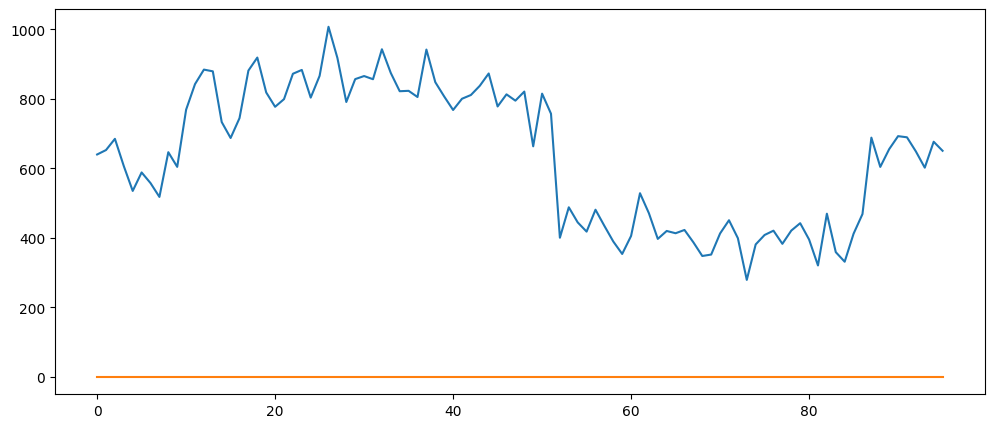

In [ ]:


plt.figure(figsize=(12, 5))
plt.plot(encoded_data[:,:2])
plt.show()


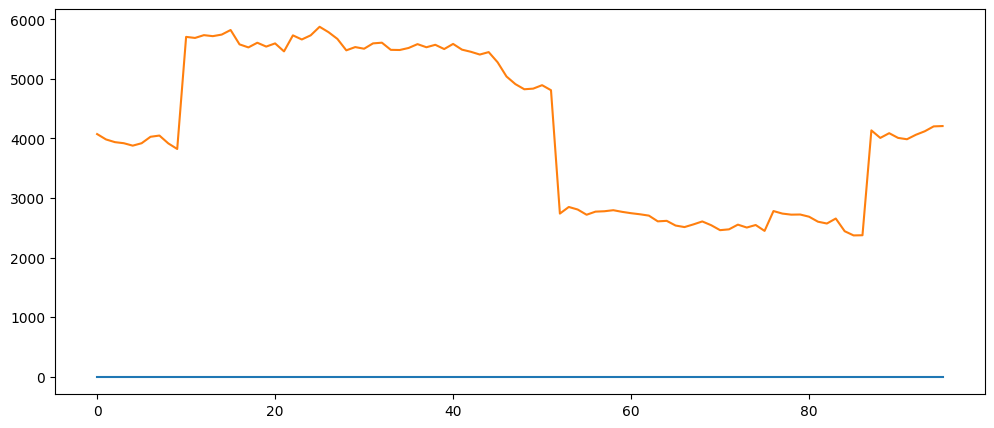

In [ ]:


plt.figure(figsize=(12, 5))
plt.plot(encoded_data[:,1:3])
plt.show()


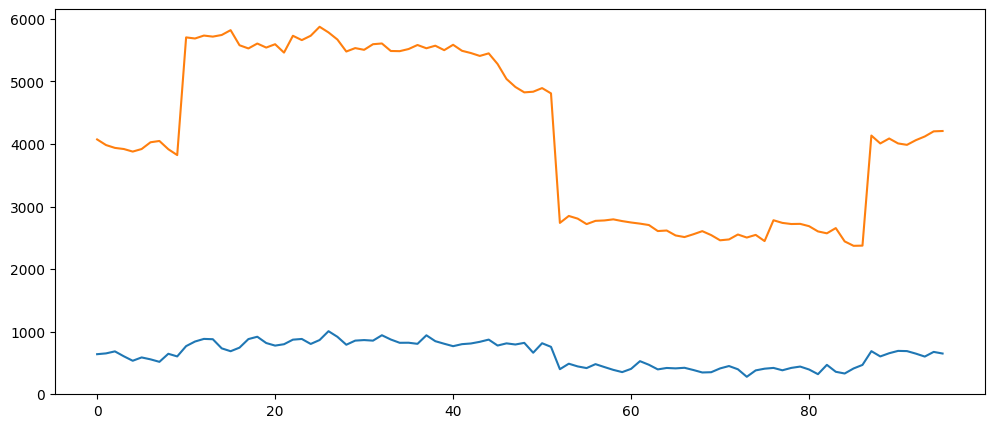

In [ ]:


plt.figure(figsize=(12, 5))
plt.plot(encoded_data[:,[0,2]])
plt.show()


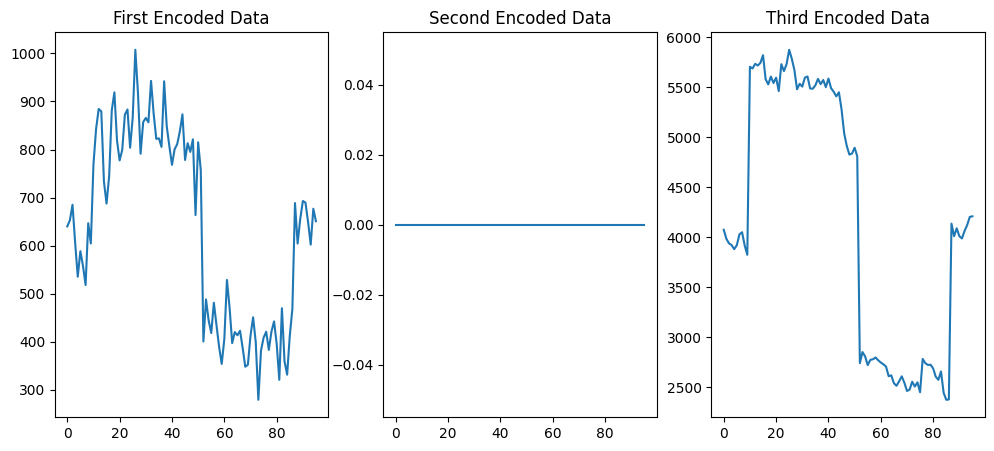

In [ ]:
# first, second and third econded data each in a separate sub-plot in the same row

import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(12, 5))

sns.lineplot(ax=axes[0], data=encoded_data[:, 0])
axes[0].set_title('First Encoded Data')

sns.lineplot(ax=axes[1], data=encoded_data[:, 1])
axes[1].set_title('Second Encoded Data')

sns.lineplot(ax=axes[2], data=encoded_data[:, 2])
axes[2].set_title('Third Encoded Data')

plt.show()


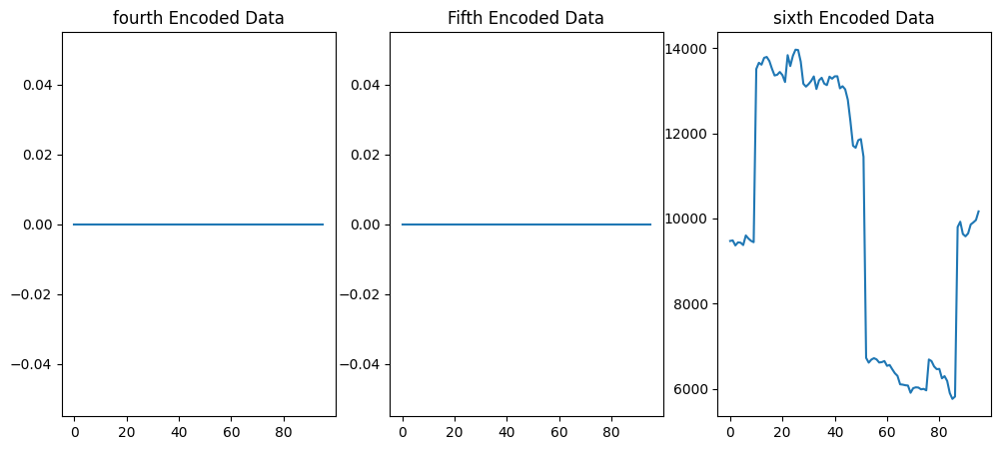

In [ ]:


fig, axes = plt.subplots(1, 3, figsize=(12, 5))

sns.lineplot(ax=axes[0], data=encoded_data[:, 3])
axes[0].set_title('fourth Encoded Data')

sns.lineplot(ax=axes[1], data=encoded_data[:, 4])
axes[1].set_title('Fifth Encoded Data')

sns.lineplot(ax=axes[2], data=encoded_data[:, 5])
axes[2].set_title('sixth Encoded Data')

plt.show()


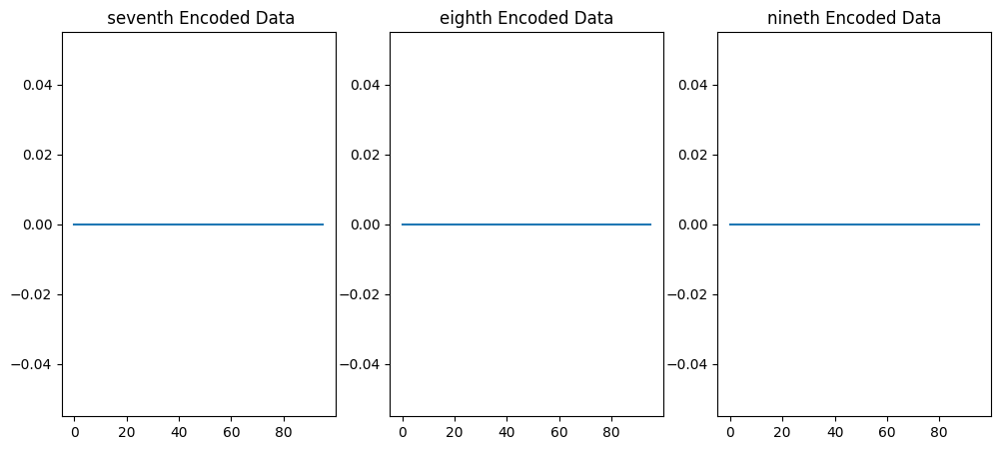

In [ ]:

fig, axes = plt.subplots(1, 3, figsize=(12, 5))

sns.lineplot(ax=axes[0], data=encoded_data[:, 6])
axes[0].set_title(' seventh Encoded Data')

sns.lineplot(ax=axes[1], data=encoded_data[:, 7])
axes[1].set_title('eighth Encoded Data')

sns.lineplot(ax=axes[2], data=encoded_data[:, 8])
axes[2].set_title('nineth Encoded Data')

plt.show()

### a)LSTM

In [ ]:
start_date = '2017-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
df = data

In [ ]:
df['ret'] = df['Close'].pct_change()
df = df.dropna()
df

,Open,High,Low,Close,Adj Close,Volume,ret
Date,,,,,,,
2017-02-07,32.634998,33.022499,32.612499,32.882500,30.563051,152735200,0.009517
2017-02-08,32.837502,33.055000,32.805000,33.009998,30.681555,92016400,0.003877
2017-02-09,32.912498,33.112499,32.779999,33.105000,30.903257,113399600,0.002878
2017-02-10,33.115002,33.235001,33.012501,33.029999,30.833244,80262000,-0.002266
2017-02-13,33.270000,33.455002,33.187500,33.322498,31.106298,92141600,0.008856
...,...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800,-0.005547
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300,-0.002841
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700,0.000518


In [ ]:
df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret90_i"] = df["ret"].rolling(90).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret120_i"] = df["ret"].rolling(120).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret240_i"] = df["ret"].rolling(240).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df =df[["Ret25_i","Ret60_i", "Ret90_i", "Ret120_i", "Ret240_i"]]
df = df.dropna()
df

<ipython-input-982-5741087b3520>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-982-5741087b3520>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-982-5741087b3520>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2018-01-19,0.039691,0.137251,0.104996,0.185403,0.329018
2018-01-22,0.028186,0.123096,0.100773,0.182367,0.311263
2018-01-23,0.028702,0.127720,0.108529,0.173703,0.307601
2018-01-24,0.002607,0.105371,0.101173,0.110443,0.288737
2018-01-25,-0.029323,0.051653,0.073188,0.102574,0.273106
...,...,...,...,...,...
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503


In [ ]:
# shift(-1) is used to alleviate data leakage in the LSTM model:
df["Ret120"] = df["Ret120_i"].shift(-120)
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
df = df.dropna()
df.tail(10)

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,
2023-12-15,0.081023,0.130778,0.109761,0.058193,0.477935,0
2023-12-18,0.050627,0.117314,0.102484,0.043354,0.459029,0
2023-12-19,0.064580,0.115291,0.108863,0.046919,0.475069,0
2023-12-20,0.039567,0.127993,0.088736,0.013094,0.427353,0
2023-12-21,0.035755,0.136132,0.099176,0.020111,0.422474,0
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428,0
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381,0
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503,0
2023-12-28,0.016122,0.118829,0.102498,0.034581,0.381580,0


splitting train and test samples by having 500 observations in each till end of sample

In [ ]:
df.index = pd.to_datetime(df.index[0:], format='Y%m%d%')

In [ ]:
df.head()

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,
2018-01-19,0.039691,0.137251,0.104996,0.185403,0.329018,1
2018-01-22,0.028186,0.123096,0.100773,0.182367,0.311263,1
2018-01-23,0.028702,0.127720,0.108529,0.173703,0.307601,1
2018-01-24,0.002607,0.105371,0.101173,0.110443,0.288737,1
2018-01-25,-0.029323,0.051653,0.073188,0.102574,0.273106,1


In [ ]:
df.shape

(1497, 6)

In [ ]:
print(len(df[497:]))

1000


In [ ]:
df = df.dropna()

In [ ]:
val_split = 0.2
train_split = 0.5
train_size = int(len(df[497:1497]) * train_split)
val_size = int(train_size * val_split)
test_size = int(len(df[497:1497]) - train_size)

window_size = 15

ts = test_size
split_time = len(df) - ts
test_time = df.iloc[split_time + window_size :, 0:1].values



Xdf, ydf = df.iloc[:, 1:-1], df.iloc[:, -1]
X = Xdf.astype("float32")
y = ydf.astype("float32")

y_train_set = y[:split_time]
y_test_set = y[split_time:]

X_train_set = X[:split_time]
X_test_set = X[split_time:]

n_features = X_train_set.shape[1]

scaler_input = MinMaxScaler(feature_range=(-1, 1))
scaler_input.fit(X_train_set)
X_train_set_scaled = scaler_input.transform(X_train_set)
X_test_set_scaled = scaler_input.transform(X_test_set)


mean_ret = np.mean(y_train_set)

scaler_output = MinMaxScaler(feature_range=(-1, 1))
y_train_set = y_train_set.values.reshape(len(y_train_set), 1)
y_test_set = y_test_set.values.reshape(len(y_test_set), 1)
scaler_output.fit(y_train_set)
y_train_set_scaled = scaler_output.transform(y_train_set)
# Times Series
training_time = df.iloc[:split_time, 0:1].values

X_train = []
y_train = []

for i in range(window_size, y_train_set_scaled.shape[0]):
    X_train.append(X_train_set_scaled[i - window_size : i, :])
    y_train.append(y_train_set_scaled[i])

X_train, y_train = np.array(X_train), np.array(y_train)

X_test = []
y_test = y_test_set

for i in range(window_size, int(y_test_set.shape[0])):
    X_test.append(X_test_set_scaled[i - window_size : i, :])

X_test, y_test = np.array(X_test), np.array(y_test)

print("Shape of test data", X_test.shape, y_test.shape)

Shape of test data (485, 15, 4) (500, 1)


In [ ]:
SEED = 1234

units_lstm = 100
n_dropout = 0.2
act_fun = "relu"

from keras import Sequential
from keras.callbacks import EarlyStopping

model = Sequential()

model.add(
    LSTM(
        units=units_lstm,
        return_sequences=True,
        activation="tanh",
        input_shape=(X_train.shape[1], n_features),
    )
)
model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(LSTM(units=units_lstm, return_sequences=False, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=51.2, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=40.96, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(1))

In [ ]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_20 (LSTM)              (None, 15, 100)           42000     
                                                                 
 lstm_21 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_31 (Dropout)        (None, 15, 100)           0         
                                                                 
 lstm_22 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_32 (Dropout)        (None, 15, 100)           0         
                                                                 
 lstm_23 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_33 (Dropout)        (None, 15, 100)         

In [ ]:
hp_lr = 1e-4
model.compile(tf.keras.optimizers.Adam(learning_rate=hp_lr), loss="mean_squared_error",)

es = EarlyStopping(monitor="val_loss", mode='min', patience=5, restore_best_weights=True)

In [ ]:
model.fit(X_train, y_train, validation_split= val_split, epochs = 1000, batch_size= 64, verbose = 0, callbacks=[es])

In [ ]:
prediction = model.predict(X_test)
prediction = scaler_output.inverse_transform(prediction)
predictions = prediction.flatten()

values = np.array(y_test[window_size:])
values = values.flatten()

16/16 [==============================] - 88s 19ms/step


In [ ]:
def R2_ofs(y_prediction, y_true, mean_ret):
  y_pred = y_prediction.reshape((-1))
  sse = 0.5*(y_pred - y_true)**2
  tse = 0.5 * (y_pred -mean_ret)**2
  r2_score = 1 -(sse / tse)

  return r2_score

In [ ]:
r2_score = R2_ofs(predictions, values, mean_ret)
print("Out_of_sample R2:",r2_score)
# Reshape prediction and values to 1-dimensional arrays if necessary
if prediction.ndim > 1:
    prediction = prediction.reshape(-1)
if values.ndim > 1:
    values = values.reshape(-1)

# Create the DataFrame
df_predictions = pd.DataFrame(
    {"Pred LSTM": prediction, "values": values}
)

Out_of_sample R2: [-1.19947357e+02 -2.71491882e+02 -1.03117090e+03 -4.79511562e+04
 -2.02778854e+02 -2.52832756e+01 -5.13270664e+00 -1.28958750e+00
 -1.50297046e-01  3.49486649e-01  5.65859914e-01  6.89396083e-01
  8.10597539e-01  8.50767255e-01  8.76116276e-01  9.08308208e-01
  9.46973562e-01  9.51290905e-01  9.63178635e-01  9.65314031e-01
  9.66563821e-01  9.73412752e-01  9.77282286e-01  9.78988051e-01
  9.77268159e-01  9.83149886e-01  9.91527259e-01  9.98894095e-01
  9.99961555e-01  9.98108804e-01  9.95738804e-01  9.94497895e-01
  9.94844019e-01  9.95638728e-01  9.96608913e-01  9.96288776e-01
  9.95939553e-01  9.91678536e-01  9.89660978e-01  9.91605937e-01
  9.92726624e-01  9.90736127e-01  9.85804617e-01  9.83070612e-01
  9.83023465e-01  9.86189127e-01  9.88879323e-01  9.93389189e-01
  9.96001899e-01  9.98015642e-01  9.99998748e-01  9.98936713e-01
  9.96510446e-01  9.93345797e-01  9.83956516e-01  9.70757663e-01
  9.57058430e-01  9.41776156e-01  9.22708690e-01  9.10305738e-01
  8.888

In [ ]:
df_predictions = df_predictions.reset_index()
del df_predictions['index']

df_predictions

,Pred LSTM,values
0,0.840017,1.0
1,0.845185,1.0
2,0.849891,1.0
3,0.855225,1.0
4,0.864085,1.0
...,...,...
542,0.882671,1.0
543,0.879262,1.0
544,0.877868,1.0
545,0.871652,1.0


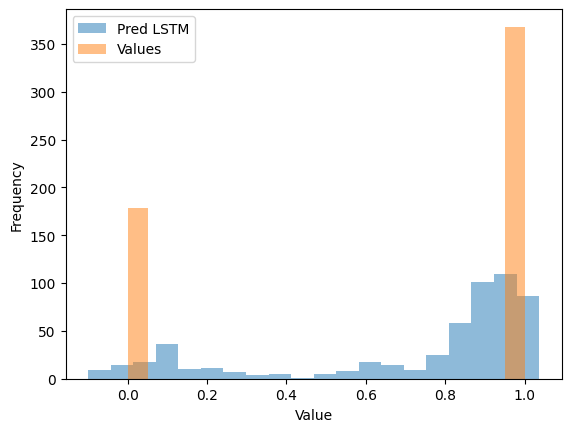

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df_predictions['Pred LSTM'], bins=20, alpha=0.5, label='Pred LSTM')
plt.hist(df_predictions['values'], bins=20, alpha=0.5, label='Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()

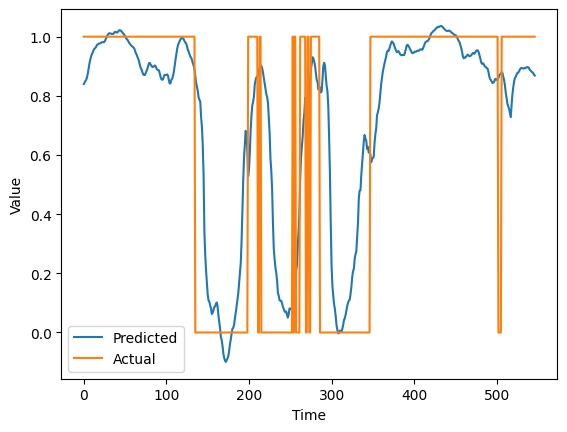

In [ ]:
import matplotlib.pyplot as plt
plt.plot(df_predictions['Pred LSTM'], label='Predicted')
plt.plot(df_predictions['values'], label='Actual')
plt.xlabel('Time')
plt.ylabel('Value')
_ = plt.legend()

# splitting train and test sets in which 500 & 100 observations exist in respectively

In [ ]:
start_date = '2017-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
df = data

In [ ]:
df['ret'] = df["Close"].pct_change()

In [ ]:
df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret90_i"] = df["ret"].rolling(90).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret120_i"] = df["ret"].rolling(120).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret240_i"] = df["ret"].rolling(240).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df =df[["Ret25_i","Ret60_i", "Ret90_i", "Ret120_i", "Ret240_i"]]
df = df.dropna()
df

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2018-01-19,0.039691,0.137251,0.104996,0.185403,0.329018
2018-01-22,0.028186,0.123096,0.100773,0.182367,0.311263
2018-01-23,0.028702,0.127720,0.108529,0.173703,0.307601
2018-01-24,0.002607,0.105371,0.101173,0.110443,0.288737
2018-01-25,-0.029323,0.051653,0.073188,0.102574,0.273106
...,...,...,...,...,...
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503


In [ ]:
# shift(-1) is used to alleviate data leakage in the LSTM model:
df["Ret120"] = df["Ret120_i"].shift(-120)
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
df = df.dropna()
df.tail(10)

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i,Output
Date,,,,,,
2023-12-15,0.081023,0.130778,0.109761,0.058193,0.477935,0
2023-12-18,0.050627,0.117314,0.102484,0.043354,0.459029,0
2023-12-19,0.064580,0.115291,0.108863,0.046919,0.475069,0
2023-12-20,0.039567,0.127993,0.088736,0.013094,0.427353,0
2023-12-21,0.035755,0.136132,0.099176,0.020111,0.422474,0
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428,0
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381,0
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503,0
2023-12-28,0.016122,0.118829,0.102498,0.034581,0.381580,0


In [ ]:
val_split = 0.2
train_split = 5/6
train_size = int(len(df[835:1497]) * train_split)
val_size = int(train_size * val_split)
test_size = int(len(df[835:1497]) - train_size)

window_size = 15

ts = test_size
split_time = len(df) - ts
test_time = df.iloc[split_time + window_size :, 0:1].values


Xdf, ydf = df.iloc[:, 1:-1], df.iloc[:, -1]
X = Xdf.astype("float32")
y = ydf.astype("float32")

y_train_set = y[:split_time]
y_test_set = y[split_time:]

X_train_set = X[:split_time]
X_test_set = X[split_time:]

n_features = X_train_set.shape[1]

scaler_input = MinMaxScaler(feature_range=(-1, 1))
scaler_input.fit(X_train_set)
X_train_set_scaled = scaler_input.transform(X_train_set)
X_test_set_scaled = scaler_input.transform(X_test_set)

mean_ret = np.mean(y_train_set)

scaler_output = MinMaxScaler(feature_range=(-1, 1))
y_train_set = y_train_set.values.reshape(len(y_train_set), 1)
y_test_set = y_test_set.values.reshape(len(y_test_set), 1)
scaler_output.fit(y_train_set)
y_train_set_scaled = scaler_output.transform(y_train_set)

# Times Series
training_time = df.iloc[:split_time, 0:1].values

X_train = []
y_train = []

for i in range(window_size, y_train_set_scaled.shape[0]):
    X_train.append(X_train_set_scaled[i - window_size : i, :])
    y_train.append(y_train_set_scaled[i])

X_train, y_train = np.array(X_train), np.array(y_train)

X_test = []
y_test = y_test_set

for i in range(window_size, int(y_test_set.shape[0])):
    X_test.append(X_test_set_scaled[i - window_size : i, :])

X_test, y_test = np.array(X_test), np.array(y_test)

print("Shape of test data", X_test.shape, y_test.shape)

Shape of test data (96, 15, 4) (111, 1)


In [ ]:
SEED = 1234

units_lstm = 100
n_dropout = 0.2
act_fun = "relu"

from keras import Sequential
from keras.callbacks import EarlyStopping

model = Sequential()

model.add(
    LSTM(
        units=units_lstm,
        return_sequences=True,
        activation="tanh",
        input_shape=(X_train.shape[1], n_features),
    )
)
model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(LSTM(units=units_lstm, return_sequences=False, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=51.2, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=40.96, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(1))

In [ ]:
model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_40 (LSTM)              (None, 15, 100)           42000     
                                                                 
 lstm_41 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_55 (Dropout)        (None, 15, 100)           0         
                                                                 
 lstm_42 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_56 (Dropout)        (None, 15, 100)           0         
                                                                 
 lstm_43 (LSTM)              (None, 15, 100)           80400     
                                                                 
 dropout_57 (Dropout)        (None, 15, 100)         

In [ ]:
hp_lr = 1e-4
model.compile(tf.keras.optimizers.Adam(learning_rate=hp_lr), loss="mean_squared_error",)

es = EarlyStopping(monitor="val_loss", mode='min', patience=5, restore_best_weights=True)

In [ ]:
model.fit(X_train, y_train, validation_split= val_split, epochs = 1000, batch_size= 64, verbose = 0, callbacks=[es])

In [ ]:
prediction = model.predict(X_test)
prediction = scaler_output.inverse_transform(prediction)
predictions = prediction.flatten()

values = np.array(y_test[window_size:])
values = values.flatten()

3/3 [==============================] - 2s 20ms/step


In [ ]:
def R2_ofs(y_prediction, y_true, mean_ret):
  y_pred = y_prediction.reshape((-1))
  sse = 0.5*(y_pred - y_true)**2
  tse = 0.5 * (y_pred -mean_ret)**2
  r2_score = 1 -(sse / tse)

  return r2_score

In [ ]:
r2_score = R2_ofs(predictions, values, mean_ret)
print("Out_of_sample R2:",r2_score)
# Reshape prediction and values to 1-dimensional arrays if necessary
if prediction.ndim > 1:
    prediction = prediction.reshape(-1)
if values.ndim > 1:
    values = values.reshape(-1)

# Create the DataFrame
df_predictions = pd.DataFrame(
    {"Pred LSTM": prediction, "values": values}
)

Out_of_sample R2: [  -27.66781    -37.02096    -48.73056    -63.831352   -86.2684
  -132.20245   -215.04266   -306.2638    -443.55157   -372.96414
  -278.49994   -224.8998    -156.16852   -102.21457    -82.924095
   -78.9414     -71.46285    -63.793663   -50.914593   -42.679676
   -38.118427   -34.784275   -36.334255   -29.253595   -21.859842
   -20.470575   -20.403578   -24.322554   -32.079033   -42.205692
   -53.450897   -60.60748    -56.428936   -57.34042    -58.301723
   -50.27733    -42.864296   -45.93843    -54.561897   -66.16447
   -77.97224    -77.873665   -72.92763    -80.06768    -92.29971
   -95.02839    -97.84273    -86.22961    -93.58075   -101.58938
  -102.111626  -101.71946   -110.19844   -118.38885   -125.38395
  -114.137856  -125.98004   -184.8283    -161.18079   -156.82942
  -158.65796   -174.99065   -254.30725   -365.74197   -576.3553
 -1102.6531   -4665.892    -1060.2651    -362.30246   -207.16742
  -115.600044   -78.868454   -59.09537    -41.971447   -35.25448
   -

In [ ]:
df_predictions = df_predictions.reset_index()
del df_predictions['index']

df_predictions

,Pred LSTM,values
0,0.674829,0.0
1,0.689108,0.0
2,0.701404,0.0
3,0.712390,0.0
4,0.723426,0.0
...,...,...
91,0.753149,0.0
92,0.759752,0.0
93,0.765466,0.0
94,0.768464,0.0


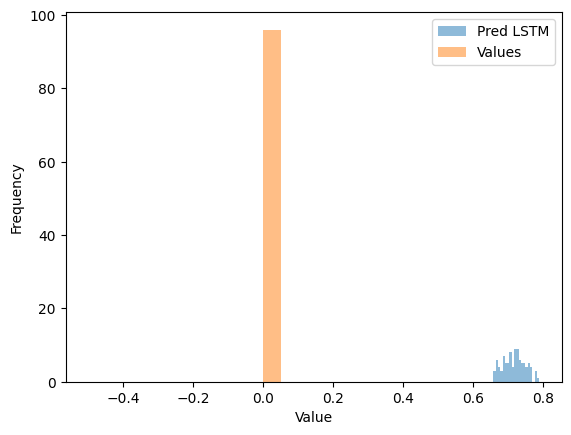

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df_predictions['Pred LSTM'], bins=20, alpha=0.5, label='Pred LSTM')
plt.hist(df_predictions['values'], bins=20, alpha=0.5, label='Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()

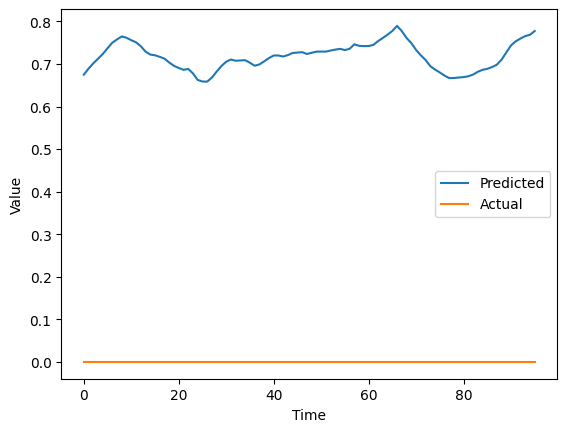

In [ ]:
import matplotlib.pyplot as plt
plt.plot(df_predictions['Pred LSTM'], label='Predicted')
plt.plot(df_predictions['values'], label='Actual')
plt.xlabel('Time')
plt.ylabel('Value')
_ = plt.legend()

# b)LSTM

In [ ]:
start_date = '2015-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-02-06,30.004999,30.062500,29.612499,29.732500,26.685776,174826400
2015-02-09,29.637501,29.959999,29.607500,29.930000,26.863039,155559200
2015-02-10,30.042500,30.537500,30.040001,30.504999,27.379116,248034000
2015-02-11,30.692499,31.230000,30.625000,31.219999,28.020849,294247200
2015-02-12,31.514999,31.870001,31.392500,31.615000,28.375370,297898000
...,...,...,...,...,...,...
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700


In [ ]:
df = data
df['ret']=data['Close'].pct_change()
df = df.dropna()

In [ ]:
df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret90_i"] = df["ret"].rolling(90).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret120_i"] = df["ret"].rolling(120).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret240_i"] = df["ret"].rolling(240).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df =df[["Ret25_i","Ret60_i", "Ret90_i", "Ret120_i", "Ret240_i"]]
df = df.dropna()
df

<ipython-input-1181-5741087b3520>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-1181-5741087b3520>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-1181-5741087b3520>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2016-01-21,-0.151208,-0.203356,-0.158917,-0.217140,-0.178680
2016-01-22,-0.080443,-0.118423,-0.115454,-0.155358,-0.132241
2016-01-25,-0.107635,-0.131599,-0.143355,-0.151309,-0.170917
2016-01-26,-0.080931,-0.167211,-0.138948,-0.113739,-0.188790
2016-01-27,-0.119548,-0.243346,-0.183213,-0.185988,-0.266991
...,...,...,...,...,...
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503


In [ ]:
df["Ret120"] = df["Ret120_i"].shift(-120)
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
del df["Ret120_i"]


In [ ]:
df= df.dropna()
df

,Ret25_i,Ret60_i,Ret90_i,Ret240_i,Output
Date,,,,,
2016-01-21,-0.151208,-0.203356,-0.158917,-0.178680,1
2016-01-22,-0.080443,-0.118423,-0.115454,-0.132241,0
2016-01-25,-0.107635,-0.131599,-0.143355,-0.170917,1
2016-01-26,-0.080931,-0.167211,-0.138948,-0.188790,1
2016-01-27,-0.119548,-0.243346,-0.183213,-0.266991,1
...,...,...,...,...,...
2023-12-22,0.021162,0.129049,0.098587,0.412428,0
2023-12-26,0.018425,0.123154,0.110315,0.388381,0
2023-12-27,0.009664,0.108821,0.108014,0.389503,0


In [ ]:

Xdf, ydf = df.iloc[:, 0:-1], df.iloc[:, -1]
X = Xdf.astype("float32")
y = ydf.astype("float32")


In [ ]:
n_train = 500
n_test = 500



pred_backtest = []
ret_backtest = []

val_split = 0.2


window_size= 15

In [ ]:
y.shape

(2000,)

In [ ]:
for i in range(0, len(y) - n_train, n_test):
    X_train, X_test = X[i : i + n_train ], X[i + n_train + window_size  : i + n_train + window_size + n_test]
    y_train, y_test = y[i : i + n_train ], y[i + n_train+ window_size : i + n_train + window_size + n_test]
    test_time = df.iloc[i + (n_train+window_size) : i + (n_train+ window_size) + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train+window_size) : i + (n_train+window_size) + n_test, 1:2].values

In [ ]:
 print(
        "ite ",
        i / n_test,
        X_train.shape,
        y_train.shape,
        X_test.shape,
        y_test.shape,

    )



ite  2.0 (500, 4) (500,) (485, 4) (485,)


In [ ]:


n_feature = X_train.shape[1]


scaler_input = MinMaxScaler(feature_range=(-1, 1))
scaler_input.fit(X_train)
X_train_scaled = scaler_input.transform(X_train)
X_test_scaled = scaler_input.transform(X_test)

scaler_output = MinMaxScaler(feature_range=(-1, 1))
y_train = y_train.values.reshape(len(y_train), 1)
y_test = y_test.values.reshape(len(y_test), 1)
scaler_output.fit(y_train)
y_train_scaled = scaler_output.transform(y_train)





In [ ]:
n_features

4

In [ ]:

X_train_scaled, y_train_scaled = np.array(X_train_scaled), np.array(y_train_scaled)

X_test_scaled, y_test = np.array(X_test_scaled), np.array(y_test)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
X_train = np.expand_dims(X_train, axis=1)  # Add a new dimension at axis 1 for time steps
X_test = np.expand_dims(X_test, axis=1)


In [ ]:

seed=1234
units_lstm = 100
n_dropout = 0.2
act_fun = "relu"

from keras import Sequential
from keras.callbacks import EarlyStopping

model = Sequential()

model.add(
    LSTM(
        units=units_lstm,
        return_sequences=True,
        activation="tanh",
        input_shape=(1,n_features),
    )
)
model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(LSTM(units=units_lstm, return_sequences=False, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=51.2, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=40.96, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(1))

In [ ]:
model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_45 (LSTM)              (None, 1, 100)            42000     
                                                                 
 lstm_46 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_61 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_47 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_62 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_48 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_63 (Dropout)        (None, 1, 100)          

In [ ]:
hp_lr = 1e-4
model.compile(tf.keras.optimizers.Adam(learning_rate=hp_lr), loss="mean_squared_error",)

es = EarlyStopping(monitor="val_loss", mode='min', patience=5, restore_best_weights=True)





In [ ]:
model.fit(X_train, y_train, validation_split= val_split, epochs = 1000, batch_size= 64, verbose = 0, callbacks=[es])

In [ ]:
    y_prob = model.predict(X_test, verbose=0)
    y_pred = np.where(y_prob > 0.50, 1, 0)

In [ ]:
    predictions = scaler_output.inverse_transform(y_pred)
    pred_backtest = np.append(pred_backtest, y_pred.flatten())
    ret_backtest = np.append(ret_backtest, Ret_vector.flatten())

In [ ]:
print(len(pred_backtest))
print(len(ret_backtest))

1455
1455


In [ ]:
y_test.shape

(485, 1)

In [ ]:
df_predictions = pd.DataFrame(
    {"Pred": pred_backtest, "Ret": ret_backtest})

In [ ]:
from google.colab import data_table
data_table.enable_dataframe_formatter()

In [ ]:

df_res = df_predictions
df_res.tail()

,Pred,Ret
1450,1.0,0.129049
1451,1.0,0.123154
1452,1.0,0.108821
1453,1.0,0.118829
1454,1.0,0.106082


In [ ]:
df_predictions = np.array(df_predictions)
df_predictions

array([[1.        , 0.07176062],
       [1.        , 0.07442693],
       [1.        , 0.13713078],
       ...,
       [1.        , 0.10882139],
       [1.        , 0.11882916],
       [1.        , 0.10608219]])

In [ ]:
values = np.array(y_test[window_size:])
values = values.flatten()

In [ ]:
r2_score = R2_ofs(pred_backtest, y_test, ret_backtest)
r2_score

array([[-0.16059321, -0.1672895 , -0.34310526, ..., -0.25912977,
        -0.28789294, -0.25142497],
       [ 1.        ,  1.        ,  1.        , ...,  1.        ,
         1.        ,  1.        ],
       [-0.16059321, -0.1672895 , -0.34310526, ..., -0.25912977,
        -0.28789294, -0.25142497],
       ...,
       [-0.16059321, -0.1672895 , -0.34310526, ..., -0.25912977,
        -0.28789294, -0.25142497],
       [-0.16059321, -0.1672895 , -0.34310526, ..., -0.25912977,
        -0.28789294, -0.25142497],
       [-0.16059321, -0.1672895 , -0.34310526, ..., -0.25912977,
        -0.28789294, -0.25142497]])

In [ ]:
# Check the shapes of the arrays
print(predictions.shape)
print(values.shape)

# If the shapes are different, you can either:
# 1. Reshape the arrays to have the same number of rows
# 2. Truncate the longer array to match the shorter one

# Reshape the arrays to have the same number of rows
predictions = predictions.reshape(-1, 1)
values = values.reshape(-1, 1)

# Truncate the longer array to match the shorter one
predictions = predictions[:values.shape[0]]

# Create the DataFrame
df_predictions = pd.DataFrame(
    {"Pred LSTM": predictions[:, 0], "values": values[:, 0]}
)

(470, 1)
(470, 1)


In [ ]:
predictions.shape

(470, 1)

In [ ]:
values.shape

(470, 1)

In [ ]:


df_predictions



,Pred LSTM,values
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,1.0,1.0
...,...,...
465,1.0,0.0
466,1.0,0.0
467,1.0,0.0
468,1.0,0.0


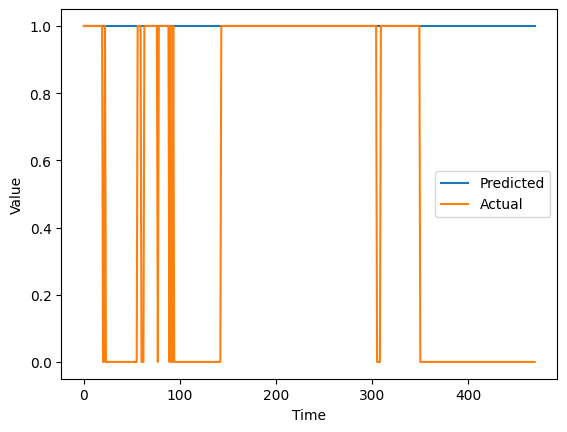

In [ ]:
import matplotlib.pyplot as plt
plt.plot(df_predictions['Pred LSTM'], label='Predicted')
plt.plot(df_predictions['values'], label='Actual')
plt.xlabel('Time')
plt.ylabel('Value')
_ = plt.legend()

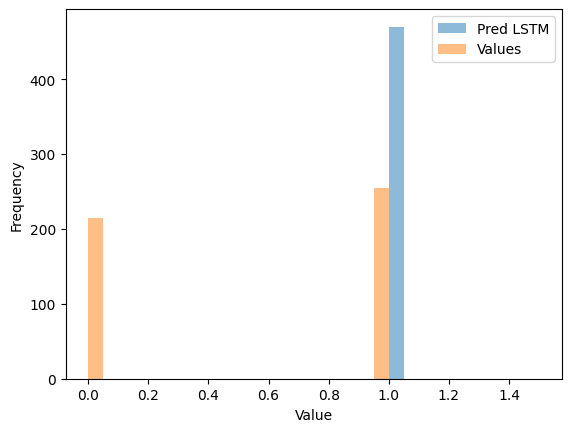

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df_predictions['Pred LSTM'], bins=20, alpha=0.5, label='Pred LSTM')
plt.hist(df_predictions['values'], bins=20, alpha=0.5, label='Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()

C)LSTM

In [ ]:
start_date = '2015-02-06'
end_date= '2023-12-31'
data= yf.download("AAPL", start=start_date, end=end_date, interval="1d")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
df = data
df['ret']=data['Close'].pct_change()
df = df.dropna()

In [ ]:
df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret90_i"] = df["ret"].rolling(90).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret120_i"] = df["ret"].rolling(120).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df["Ret240_i"] = df["ret"].rolling(240).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
df =df[["Ret25_i","Ret60_i", "Ret90_i", "Ret120_i", "Ret240_i"]]
df = df.dropna()
df

<ipython-input-1253-5741087b3520>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret25_i"] = df["ret"].rolling(25).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-1253-5741087b3520>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Ret60_i"] = df["ret"].rolling(60).apply(lambda x: 100 * (np.prod(1 + x / 100) - 1))
<ipython-input-1253-5741087b3520>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

,Ret25_i,Ret60_i,Ret90_i,Ret120_i,Ret240_i
Date,,,,,
2016-01-21,-0.151208,-0.203356,-0.158917,-0.217140,-0.178680
2016-01-22,-0.080443,-0.118423,-0.115454,-0.155358,-0.132241
2016-01-25,-0.107635,-0.131599,-0.143355,-0.151309,-0.170917
2016-01-26,-0.080931,-0.167211,-0.138948,-0.113739,-0.188790
2016-01-27,-0.119548,-0.243346,-0.183213,-0.185988,-0.266991
...,...,...,...,...,...
2023-12-22,0.021162,0.129049,0.098587,0.020434,0.412428
2023-12-26,0.018425,0.123154,0.110315,0.015084,0.388381
2023-12-27,0.009664,0.108821,0.108014,0.021494,0.389503


In [ ]:
df["Ret120"] = df["Ret120_i"].shift(-120)
df["Output"] = df["Ret120"] > 0
df["Output"] = df["Output"].astype(int)
del df["Ret120"]
del df["Ret120_i"]

In [ ]:
Xdf, ydf = df.iloc[:, 0:-1], df.iloc[:, -1]
X = Xdf.astype("float32")
y = ydf.astype("float32")

In [ ]:
n_train = 500
n_test = 100

time_backtest = []
time_backtest = np.array(time_backtest)
time_backtest = time_backtest.astype("datetime64", copy=False)

pred_backtest = []
ret_backtest = []

val_split = 0.2



window_size = 15

In [ ]:
for i in range(0, len(y) - n_train, n_test):
    X_train, X_test = X[i : i + (n_train)], X[i + n_train + window_size  : i + n_train + window_size + n_test]
    y_train, y_test = y[i : i + (n_train)], y[i + n_train+ window_size : i + n_train + window_size + n_test]
    test_time = df.iloc[i + (n_train) + window_size : i + n_train + window_size + n_test, 0:1].values
    Ret_vector = df.iloc[i + (n_train) + window_size: i + n_train + window_size + n_test, 1:2].values

In [ ]:
print(
        "ite ",
        i / n_test,
        " -- start test:",
        test_time,
        " -- end test",
        test_time,
        " ------- ",
        X_train.shape,
        y_train.shape,
        X_test.shape,
        y_test.shape,
        test_time.shape,
        Ret_vector.shape,
    )

ite  14.0  -- start test: [[-0.03279558]
 [-0.02504424]
 [-0.03008686]
 [-0.03198551]
 [-0.06349422]
 [-0.077247  ]
 [-0.06644116]
 [-0.01180862]
 [-0.01161557]
 [-0.02877913]
 [-0.01104575]
 [-0.01396475]
 [ 0.00395774]
 [ 0.00074558]
 [-0.00804734]
 [-0.0119776 ]
 [ 0.0075226 ]
 [ 0.01208703]
 [-0.01904954]
 [-0.03584742]
 [-0.05625888]
 [-0.02705075]
 [-0.02485921]
 [-0.04146953]
 [-0.05596198]
 [-0.06792729]
 [-0.05435862]
 [-0.05437079]
 [-0.05898711]
 [-0.01529987]
 [ 0.01901551]
 [ 0.00522888]
 [-0.00212047]
 [ 0.00615668]
 [ 0.0106174 ]
 [-0.00032629]
 [-0.01087698]
 [-0.02709174]
 [-0.03072801]
 [-0.0242282 ]
 [-0.03994185]
 [-0.0369184 ]
 [-0.03199565]
 [-0.00578069]
 [ 0.02185631]
 [ 0.04102785]
 [ 0.03279711]
 [ 0.03256669]
 [ 0.05479625]
 [ 0.05337183]
 [ 0.04354481]
 [ 0.05067016]
 [ 0.03362814]
 [ 0.05127255]
 [ 0.04640733]
 [ 0.05038991]
 [ 0.06058338]
 [ 0.07059468]
 [ 0.07515217]
 [ 0.08607049]
 [ 0.08122289]
 [ 0.09499275]
 [ 0.09751511]
 [ 0.08955454]
 [ 0.10612607]

In [ ]:


n_feature = X_train.shape[1]


scaler_input = MinMaxScaler(feature_range=(-1, 1))
scaler_input.fit(X_train)
X_train_scaled = scaler_input.transform(X_train)
X_test_scaled = scaler_input.transform(X_test)

scaler_output = MinMaxScaler(feature_range=(-1, 1))
y_train = y_train.values.reshape(len(y_train), 1)
y_test = y_test.values.reshape(len(y_test), 1)
scaler_output.fit(y_train)
y_train_scaled = scaler_output.transform(y_train)




In [ ]:

X_train_scaled, y_train_scaled = np.array(X_train_scaled), np.array(y_train_scaled)

X_test_scaled, y_test = np.array(X_test_scaled), np.array(y_test)

In [ ]:
X_train = np.expand_dims(X_train, axis=1)  # Add a new dimension at axis 1 for time steps
X_test = np.expand_dims(X_test, axis=1)


In [ ]:
seed=1234
units_lstm = 100
n_dropout = 0.2
act_fun = "relu"

from keras import Sequential
from keras.callbacks import EarlyStopping

model = Sequential()

model.add(
    LSTM(
        units=units_lstm,
        return_sequences=True,
        activation="tanh",
        input_shape=(1, n_features),
    )
)
model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))


model.add(LSTM(units=units_lstm, return_sequences=True, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(LSTM(units=units_lstm, return_sequences=False, activation="tanh"))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=51.2, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(units=40.96, activation=act_fun))
model.add(Dropout(n_dropout, seed=SEED))

model.add(Dense(1))

In [ ]:
model.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_50 (LSTM)              (None, 1, 100)            42000     
                                                                 
 lstm_51 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_67 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_52 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_68 (Dropout)        (None, 1, 100)            0         
                                                                 
 lstm_53 (LSTM)              (None, 1, 100)            80400     
                                                                 
 dropout_69 (Dropout)        (None, 1, 100)          

In [ ]:
hp_lr = 1e-4
model.compile(tf.keras.optimizers.Adam(learning_rate=hp_lr), loss="mean_squared_error",)

es = EarlyStopping(monitor="val_loss", mode='min', patience=5, restore_best_weights=True)


class_weight = {0: (np.mean(y_train) / 0.5), 1: 1}


In [ ]:
model.fit(X_train, y_train, validation_split= val_split, epochs = 1000, batch_size= 64, verbose = 0, callbacks=[es], class_weight= class_weight)

In [ ]:
    y_prob = model.predict(X_test, verbose=0)
    y_pred = np.where(y_prob > 0.50, 1, 0)

In [ ]:
    predictions = scaler_output.inverse_transform(y_pred)
    pred_backtest = np.append(pred_backtest, y_pred.flatten())
    ret_backtest = np.append(ret_backtest, Ret_vector.flatten())

In [ ]:
values = np.array(y_test[window_size:])
values = values.flatten()

In [ ]:

    pred_backtest = np.append(pred_backtest, y_pred.flatten())
    ret_backtest = np.append(ret_backtest, Ret_vector.flatten())

In [ ]:
df_predictions = pd.DataFrame(
    {"Pred": pred_backtest, "Ret": ret_backtest})

In [ ]:
df_res = df_predictions
df_res.tail()

,Pred,Ret
165,1.0,0.129049
166,1.0,0.123154
167,1.0,0.108821
168,1.0,0.118829
169,1.0,0.106082


In [ ]:
# Check the shapes of the arrays
print(predictions.shape)
print(values.shape)

# If the shapes are different, you can either:
# 1. Reshape the arrays to have the same number of rows
# 2. Truncate the longer array to match the shorter one

# Reshape the arrays to have the same number of rows
predictions = predictions.reshape(-1, 1)
values = values.reshape(-1, 1)

# Truncate the longer array to match the shorter one
predictions = predictions[:values.shape[0]]

# Create the DataFrame
df_predictions = pd.DataFrame(
    {"Pred LSTM": predictions[:, 0], "values": values[:, 0]})

(85, 1)
(70,)


In [ ]:
df_predictions

,Pred LSTM,values
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0
...,...,...
65,1.0,0.0
66,1.0,0.0
67,1.0,0.0
68,1.0,0.0


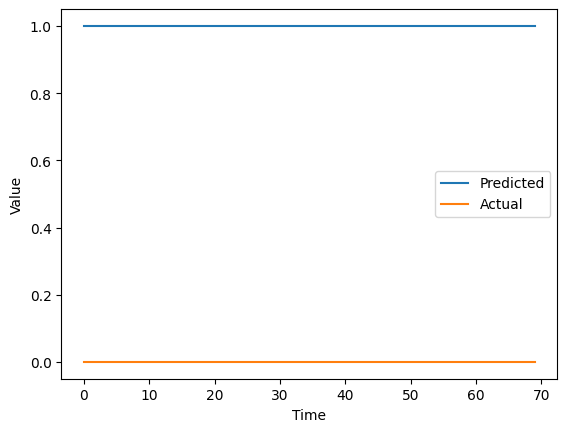

In [ ]:
import matplotlib.pyplot as plt
plt.plot(df_predictions['Pred LSTM'], label='Predicted')
plt.plot(df_predictions['values'], label='Actual')
plt.xlabel('Time')
plt.ylabel('Value')
_ = plt.legend()

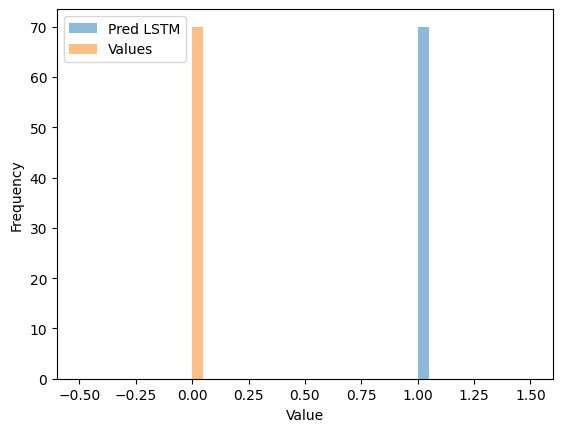

In [ ]:
import matplotlib.pyplot as plt
plt.hist(df_predictions['Pred LSTM'], bins=20, alpha=0.5, label='Pred LSTM')
plt.hist(df_predictions['values'], bins=20, alpha=0.5, label='Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()